In [245]:
import test_data
import networkx as nx
import numpy as np
from scipy.sparse import csgraph
from scipy.sparse.linalg import eigsh
from collections import Counter, defaultdict
import matplotlib.pyplot as plt
from scipy.signal import find_peaks
from scipy.interpolate import UnivariateSpline
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import normalize
from scipy.sparse import diags

test_graphs = test_data.generate_random_hamiltonian_graphs(120,4,0.01)
def extract_graphs(test_graphs):
    graphs = []
    for graph in test_graphs:
        if isinstance(graph, nx.Graph):
            graphs.append(graph)
        elif isinstance(graph,dict) and 'graph' in graph:
            graphs.append(graph['graph'])
        else:
            raise ValueError("unsupported graph type")
    return graphs

graphs = extract_graphs(test_graphs)

In [246]:
# laplacian basic functions
def compute_laplacian(G, normalized=True):
    A = nx.to_scipy_sparse_array(G, weight='weight', dtype=float)
    if normalized:
        return csgraph.laplacian(A, normed=True)
    else:
        return csgraph.laplacian(A, normed=False)

def compute_laplacian_eigenpairs(L, k, v0, tol=1e-6):
    vals, vecs = eigsh(L, k=k, v0=v0, tol=tol, which='SM')
    idx = np.argsort(vals)
    return vals[idx], vecs[:, idx]

def normalize_rows(X):
    return X / (np.linalg.norm(X, axis=1, keepdims=True)+1e-8)

# identify chains plus contractions
def normalize_key(u, v):
    return tuple(sorted((u, v)))

def walk_interior_chain(G, curr, prev, used):
    chain = []
    while True:
        if G.degree(curr) != 2 or curr in used:
            break
        neighbors = [nbr for nbr in G.neighbors(curr) if nbr != prev]
        if not neighbors:
            break
        used.add(curr)
        chain.append(curr)
        prev, curr = curr, neighbors[0]
    return chain, curr

def identify_chains(G):
    deg2_nodes = [n for n in G.nodes if G.degree(n) == 2]
    used = set()
    endpoint_dict = defaultdict(lambda: defaultdict(list))

    for node in deg2_nodes:
        if node in used:
            continue

        neighbors = list(G.neighbors(node))
        if len(neighbors) != 2:
            continue

        left, right = neighbors
        left_chain, left_end = walk_interior_chain(G, left, node, used)
        right_chain, right_end = walk_interior_chain(G, right, node, used)

        full_chain = left_chain[::-1] + [node] + right_chain
        endpoints = (left_end, right_end)
        length = len(full_chain)

        if length == 0:
            continue

        all_nodes = [left_end] + full_chain + [right_end]
        chain_data = {
            'chain': full_chain,
            'length': length,
            'edges': all_nodes,
            'endpoints': endpoints
        }

        for endpoint in endpoints:
            endpoint_dict[endpoint][length].append(chain_data)

        for n in full_chain:
            used.add(n)

    return dict(endpoint_dict)


def contract_chains_with_ancestry(G, prev_chain_to_ancestry=None, used_nodes=None):
    if prev_chain_to_ancestry is None:
        prev_chain_to_ancestry = {}
    if used_nodes is None:
        used_nodes = set()

    G_contr = G.copy()
    chain_dict = identify_chains(G)

    contracted_edges = []
    chain_to_ancestry = {}
    node_to_chain = {}

    for endpoint in chain_dict:
        for length in chain_dict[endpoint]:
            for chain_info in chain_dict[endpoint][length]:
                u, v = chain_info['endpoints']
                path = chain_info['edges']
                inner_nodes = chain_info['chain']
                if any(n in used_nodes for n in inner_nodes):
                    continue

                shortcut = tuple(sorted((u, v)))
                if shortcut in chain_to_ancestry:
                    continue

                inner_shortcuts = [
                    tuple(sorted((path[i], path[i + 1])))
                    for i in range(len(path) - 1)
                    if tuple(sorted((path[i], path[i + 1]))) in prev_chain_to_ancestry
                ]
                G_contr.add_edge(u, v)
                for node in inner_nodes:
                    if node in G_contr:
                        G_contr.remove_node(node)
                        used_nodes.add(node)

                contracted_edges.append(shortcut)
                chain_to_ancestry[shortcut] = {
                    'nodes': path,
                    'ancestry': [prev_chain_to_ancestry[k] for k in inner_shortcuts] if inner_shortcuts else [],
                    'sub_shortcuts': inner_shortcuts
                }

                for node in path:
                    node_to_chain[node] = shortcut
    return G_contr, contracted_edges, chain_to_ancestry, node_to_chain, used_nodes

def clean_ham_cond(G_contr, chain_shortcuts):
    G_cleaned = G_contr.copy()
    removed_edges = []
    shortcut_set = {tuple(sorted(e)) for e in chain_shortcuts if e in G_contr.edges()}

    node_count = Counter([node for e in shortcut_set for node in e])

    for node, count in node_count.items():
        if count > 1:
            for neighbor in list(G_contr.neighbors(node)):
                edge = tuple(sorted((node, neighbor)))
                if edge not in shortcut_set and G_cleaned.has_edge(node, neighbor):
                    G_cleaned.remove_edge(node, neighbor)
                    removed_edges.append(edge)
    return G_cleaned, removed_edges

def extract_final_shortcuts(chain_to_ancestry):
    final_shortcuts = set(chain_to_ancestry.keys())
    for val in chain_to_ancestry.values():
        for sub in val.get("sub_shortcuts", []):
            final_shortcuts.discard(sub)
    return list(final_shortcuts)

def full_contraction_with_ancestry(G, verbose=False):
    G_curr = G.copy()
    all_shortcuts = []
    chain_to_ancestry = {}
    node_to_chain = {}
    all_removed_edges = []
    used_nodes = set()

    while True:
        if verbose:
            print(f"New contraction round: {G_curr.number_of_nodes()} nodes, {G_curr.number_of_edges()} edges")

        G_contr, shortcuts, new_chain_to_ancestry, new_node_to_chain, used_nodes = contract_chains_with_ancestry(
            G_curr, chain_to_ancestry, used_nodes
        )

        if not shortcuts:
            if verbose:
                print("No more chains to contract.")
            break

        all_shortcuts.extend(shortcuts)
        G_cleaned, removed_edges = clean_ham_cond(G_contr, all_shortcuts)
        
        G_curr = G_cleaned
        
        chain_to_ancestry.update(new_chain_to_ancestry)
        node_to_chain.update(new_node_to_chain)
        all_removed_edges.extend(removed_edges)

        if not any(G_curr.degree(n) == 2 for n in G_curr.nodes):
            if verbose:
                print("No more degree-2 nodes: finished.")
            break
    return G_curr, extract_final_shortcuts(chain_to_ancestry), chain_to_ancestry, node_to_chain, all_removed_edges

best k: 11 (method: first for 89 dims)
score: 0.002469108308240985, stability: 1.0


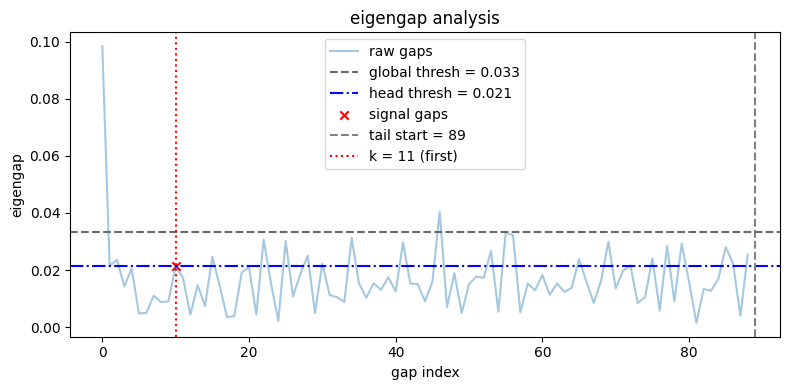

best k: 19 (method: first for 34 dims)
score: 0.002112258382612279, stability: 1.0


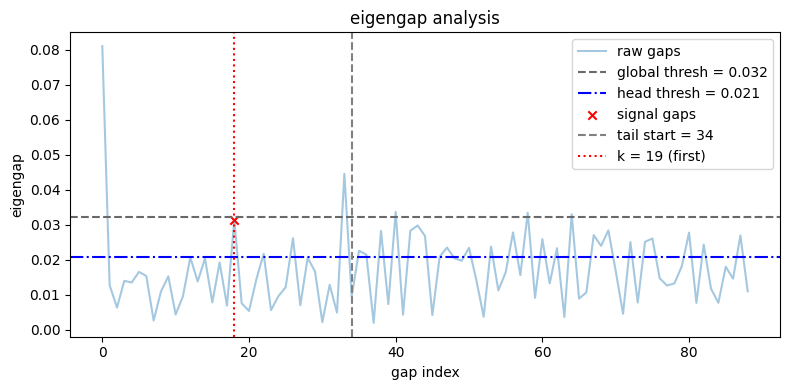

best k: 11 (method: first for 48 dims)
score: 0.0028329805551891856, stability: 1.0


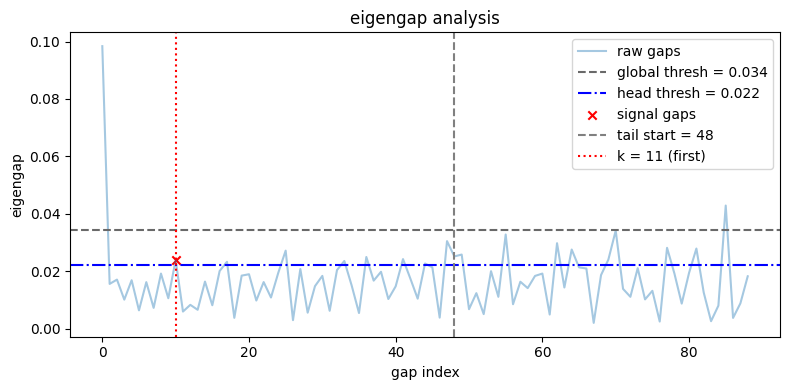

best k: 18 (method: first for 56 dims)
score: 0.0015960774338761284, stability: 1.0


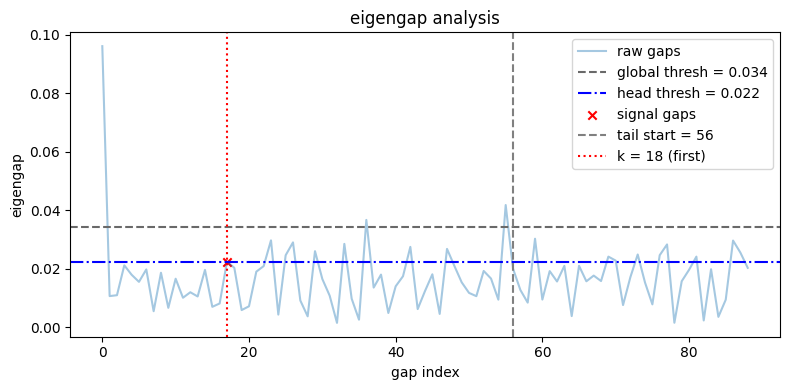

In [247]:
def plot_eigengap(evals, gaps, tail_start, global_thresh, k, signal_idxs=None, mode=None, thresh=None):
    plt.figure(figsize=(8, 4))
    plt.plot(gaps, label='raw gaps', alpha=0.4)
    plt.axhline(global_thresh, color='dimgray', linestyle='--', label=f'global thresh = {global_thresh:.3f}')
    if thresh is not None:
        plt.axhline(thresh, color='blue', linestyle='-.', label=f'head thresh = {thresh:.3f}')
    if signal_idxs is not None and len(signal_idxs):
        plt.scatter(signal_idxs, np.array(gaps)[signal_idxs], color='red', marker='x', label='signal gaps')
    if tail_start is not None:
        plt.axvline(tail_start, color='gray', linestyle='--', label=f'tail start = {tail_start}')
    if k is not None:
        plt.axvline(k-1, color='red', linestyle='dotted', label=f'k = {k} ({mode})')
    plt.xlabel('gap index')
    plt.ylabel('eigengap')
    plt.title('eigengap analysis')
    plt.legend()
    plt.tight_layout()
    plt.show()

def find_candidate_ks(
    gaps, evals, evecs, method='median', prominence=0.01,
    thresh_factor=1, min_window=20, sample_size=100):

    dim = len(gaps)
    candidates = []
    k_to_index = {}
    while dim >= min_window:
        g = gaps[:dim]
        threshold = np.median(g) + thresh_factor * np.std(g) if method == 'median' else np.mean(g) + thresh_factor * np.std(g)
        peaks, _ = find_peaks(g, height=threshold, prominence=prominence)
        if not len(peaks):
            break
        first_p = peaks[0]
        highest_p = peaks[np.argmax(g[peaks])]
        for p in {first_p, highest_p}:
            k = p + 1
            if k in k_to_index:
                idx = k_to_index[k]
                if dim < candidates[idx]['dim']:
                    candidates[idx]['dim'] = dim
                continue
            if k >= dim:
                continue
            eigengap = g[p]
            X = normalize_rows(evecs[:, 1:k+1])
            idx_sample = np.random.choice(X.shape[0], max(sample_size, X.shape[0]), replace=False)
            Xs = X[idx_sample]
            sil = silhouette_score(Xs, KMeans(n_clusters=k, n_init=10, random_state=42).fit(Xs).labels_) if k > 1 else -1
            score = (eigengap / k) * (1 + sil) if sil >= 0.2 else -np.inf
            candidates.append({
                'k': k,
                'eigengap': eigengap,
                'silhouette': sil,
                'score': score,
                'index': p,
                'threshold': threshold,
                'type': 'first' if p == first_p else 'highest',
                'dim': dim
            })
            k_to_index[k] = len(candidates) - 1
        dim = highest_p + 1
    return candidates

def perturb_laplacian(L, noise_level, n):
    A = -L.copy()
    A.setdiag(0)
    A = A.tolil()
    deg = np.array(-A.sum(axis=1)).flatten()
    deg[deg < 0] = 0
    if deg.sum() == 0:
        return L
    prob = deg / deg.sum()
    num_edges = int(noise_level * n)
    for _ in range(num_edges):
        i, j = np.random.choice(n, 2, p=prob)
        if i != j:
            A[i, j] = A[j, i] = 1
    A = A.tocsr()
    D = diags(np.array(A.sum(axis=1)).flatten())
    return D - A

def check_candidate_stability(L, candidates, noise_level=0.01, repeats=5):
    n = L.shape[0]
    for c in candidates:
        k = c['k']
        eigengap = c['eigengap']
        cnt = 0
        for _ in range(repeats):
            Lp = perturb_laplacian(L, noise_level, n)
            vals, _ = eigsh(Lp, k=k+2, which='SM', tol=1e-6)
            vals.sort()
            gap = vals[k] - vals[k-1]
            if gap >= 0.5 * eigengap:
                cnt += 1
        c['stability'] = cnt / repeats
        c['score_stable'] = c['score'] * c['stability']
    return candidates

def select_best_candidate(candidates):
    candidates = [c for c in candidates if c.get('stability',0) >= 0.5 and c['score_stable'] > -np.inf]
    if not candidates:
        return None
    candidates.sort(key=lambda c: c['score_stable'], reverse=True)
    return candidates[0]

def spectral_k_pipeline(L, evals, evecs, gaps,
    method='median', prominence=0.01, thresh_factor=1, min_window=10, 
    sample_size=100, noise_level=0.01, repeats=5):

    candidates = find_candidate_ks(
        gaps, evals, evecs, method=method, prominence=prominence,
        thresh_factor=thresh_factor, min_window=min_window, sample_size=sample_size
    )
    candidates = check_candidate_stability(L, candidates, noise_level=noise_level, repeats=repeats)
    best = select_best_candidate(candidates)
    return best, candidates

laplacian_data = []
for G in graphs:
    L = compute_laplacian(G, normalized=True)
    n = L.shape[0]
    kmax = max(2, int(n * 0.75))
    if not hasattr(L, "tocsc"):
        L = L.toarray()
    evals, evecs = eigsh(L, k=kmax, which='SM')
    idx = np.argsort(evals)
    evals = evals[idx]
    evecs = evecs[:, idx]
    gaps = np.diff(evals)
    global_thresh = np.median(gaps) + 1.5 * np.std(gaps)
    best, candidates = spectral_k_pipeline(
        L, evals, evecs, gaps,
        prominence=0.01, thresh_factor=0.5, min_window=10, 
        sample_size=100, noise_level=0.01, repeats=5
    )
    name = getattr(G, 'name', 'graph')
    if best:
        print(f'best k: {best["k"]} (method: {best.get("type", "unknown")} for {best.get("dim", "?")} dims)')
        print(f"score: {best["score"]}, stability: {best["stability"]}")
        plot_eigengap(evals, gaps, best.get('dim', None), global_thresh, best['k'],
                      signal_idxs=[best['index']] if 'index' in best else None,
                      mode=best.get('type', None), thresh=best.get('threshold', None))
    else:
        print(f'[{name}] no good k found.')
        plot_eigengap(evals, gaps, None, global_thresh, None)
    laplacian_data.append({
        'graph': G,
        'laplacian': L,
        'evals': evals,
        'evecs': evecs,
        'gaps': gaps,
        'best': best,
        'candidates': candidates
    })


In [248]:
def compute_signless_laplacian(G):
    A = nx.to_scipy_sparse_array(G, weight='weight', dtype=float, format='csr')
    D = diags(A.sum(axis=1).flatten())
    return D + A

def perturb_signless_laplacian(Q, noise_level, n):
    A = Q.copy()
    A.setdiag(0)
    A = -A
    A = A.tolil()
    deg = np.array(A.sum(axis=1)).flatten()
    deg[deg < 0] = 0
    if deg.sum() == 0:
        return Q
    prob = deg / deg.sum()
    num_edges = int(noise_level * n)
    for _ in range(num_edges):
        i, j = np.random.choice(n, 2, p=prob)
        if i != j:
            A[i, j] = A[j, i] = -1
    A = -A
    A = A.tocsr()
    D = diags(np.array(A.sum(axis=1)).flatten())
    return D + A

def analyze_eigengap_spectrum(evals, smooth=0.01):
    gaps = -np.diff(evals)
    x = np.arange(len(gaps))
    spline = UnivariateSpline(x, gaps, s=smooth)
    smoothed = spline(x)
    return evals, gaps, smoothed

def find_tail_start(smoothed, global_thresh):
    for i in range(len(smoothed)):
        if np.all(smoothed[i:] < global_thresh):
            return i
    return len(smoothed)

def fuzzy_cmeans_memberships(x, k):
    km = KMeans(n_clusters=k, n_init=10, random_state=42)
    dists = km.fit_transform(x)
    memberships = np.exp(-dists)
    memberships /= memberships.sum(axis=1, keepdims=True)
    labels = np.argmax(memberships, axis=1)
    return labels, memberships

def compute_silhouette_general(x, labels, memberships=None):
    if x.shape[0] < 2 or len(np.unique(labels)) < 2:
        print(f"not enough data points or labels for silhouette score")
        return -1
    try:
        return silhouette_score(x, labels)
    except Exception:
        return -1

def check_candidate_stability_signless(Q, candidates, tail_start, noise_level=0.01, repeats=5):
    n = Q.shape[0]
    for c in candidates:
        k = c['k']
        cnt = 0
        for _ in range(repeats):
            Qp = perturb_signless_laplacian(Q, noise_level, n)
            vals, _ = eigsh(Qp, k=tail_start+2, which='LM', v0=np.ones(n), tol=1e-6)
            idx = np.argsort(vals)[::-1]
            vals = vals[idx]
            gaps = -np.diff(vals)
            if c['mode'] == 'dom':
                gap = gaps[k-1] if k <= len(gaps) else 0
                if gap >= 0.5 * c['eigengap']:
                    cnt += 1
            else:
                idxs = c.get('signal_idxs')
                if idxs is not None and len(idxs) > 0:
                    stable = True
                    for i in idxs:
                        i = int(i)
                        if i >= len(gaps) or gaps[i] < 0.5 * c['eigengap']:
                            stable = False
                            break
                    if stable:
                        cnt += 1
                else:
                    if np.median(gaps) >= 0.5 * c['eigengap']:
                        cnt += 1
        c['stability'] = cnt / repeats
        c['score_stable'] = c['score'] * c['stability']
    return candidates

def plot_gap_analysis(evals, gaps, smoothed, tail_start, global_thresh, k, signal_idxs=None, mode=None, thresh=None):
    # plots eigengap spectrum and key selection lines
    plt.figure(figsize=(8, 4))
    plt.plot(gaps, label='raw gaps', alpha=0.4)
    plt.plot(smoothed, label='smoothed', linewidth=1.5)
    plt.axhline(global_thresh, color='dimgray', linestyle='--', label=f'global thresh = {global_thresh:.3f}')
    if thresh is not None:
        plt.axhline(thresh, color='blue', linestyle='-.', label=f'head thresh = {thresh:.3f}')
    if signal_idxs is not None and len(signal_idxs):
        plt.scatter(signal_idxs, np.array(gaps)[signal_idxs], color='red', marker='x', label='signal gaps')
    if tail_start is not None:
        plt.axvline(tail_start, color='gray', linestyle='--', label=f'tail start = {tail_start}')
    if k is not None:
        plt.axvline(k-1, color='red', linestyle='dotted', label=f'k = {k} ({mode})')
    plt.xlabel('gap index')
    plt.ylabel('eigengap')
    plt.title('eigengap analysis')
    plt.legend()
    plt.tight_layout()
    plt.show()



Processing graph:
  Candidates tested (mode, k, eigengap, silhouette, score):
    mode: fallback, k: 3, gap: 1.545, sil: 0.605, score: 1.605

  Best with mode=fallback, k=3, silhouette=0.605 score=1.605, head_thresh=0.317, alpha=None


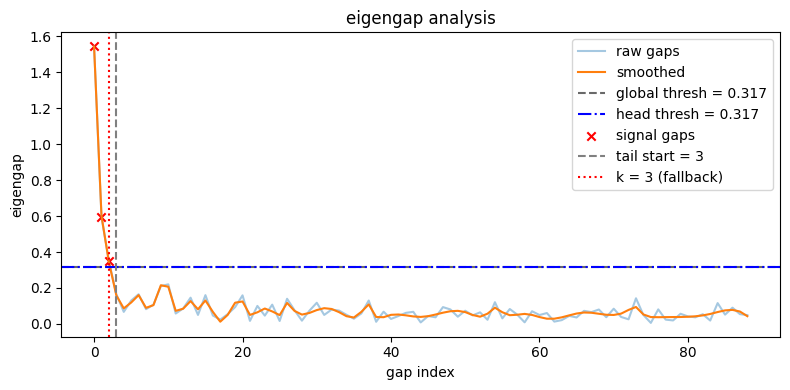


Processing graph:
  Candidates tested (mode, k, eigengap, silhouette, score):
    mode: perron, k: 6, gap: 0.311, sil: 0.451, score: 0.528
    mode: perron, k: 5, gap: 0.356, sil: 0.472, score: 0.549
    mode: perron, k: 4, gap: 0.386, sil: 0.452, score: 0.529
    mode: perron, k: 4, gap: 0.386, sil: 0.452, score: 0.529

  Best with mode=perron, k=5, silhouette=0.472 score=0.549, head_thresh=0.157, alpha=0.150


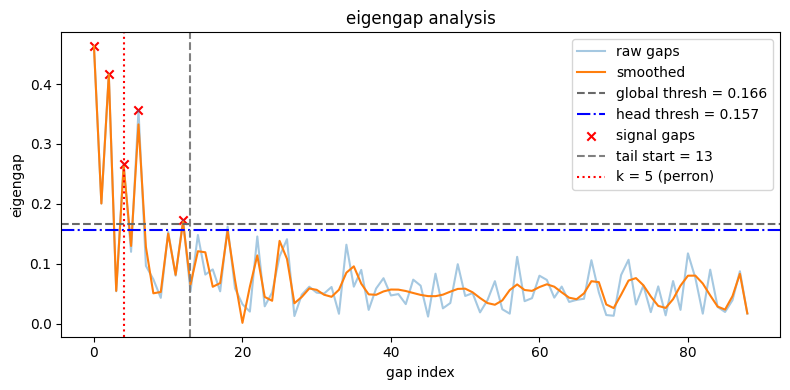


Processing graph:
  Candidates tested (mode, k, eigengap, silhouette, score):
    mode: perron, k: 4, gap: 0.357, sil: 0.518, score: 0.618
    mode: perron, k: 4, gap: 0.357, sil: 0.518, score: 0.618
    mode: perron, k: 4, gap: 0.357, sil: 0.518, score: 0.618
    mode: perron, k: 3, gap: 0.415, sil: 0.536, score: 0.636

  Best with mode=perron, k=3, silhouette=0.536 score=0.636, head_thresh=0.216, alpha=0.500


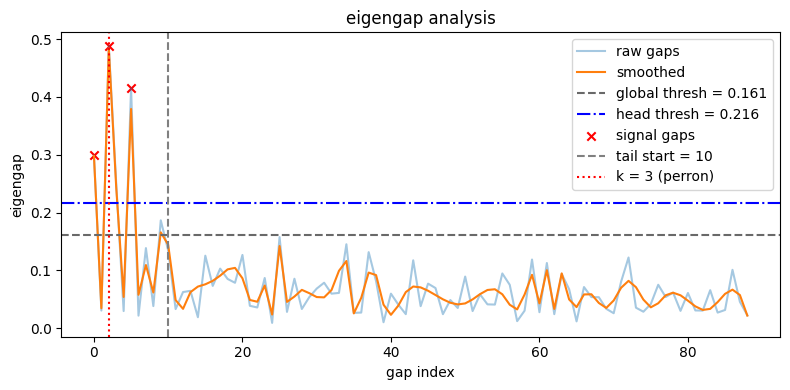


Processing graph:
  Candidates tested (mode, k, eigengap, silhouette, score):
    mode: perron, k: 6, gap: 0.246, sil: 0.438, score: 0.497
    mode: perron, k: 6, gap: 0.246, sil: 0.438, score: 0.497
    mode: perron, k: 6, gap: 0.246, sil: 0.438, score: 0.497
    mode: perron, k: 6, gap: 0.246, sil: 0.438, score: 0.497

  Best with mode=perron, k=6, silhouette=0.438 score=0.497, head_thresh=0.138, alpha=0.050


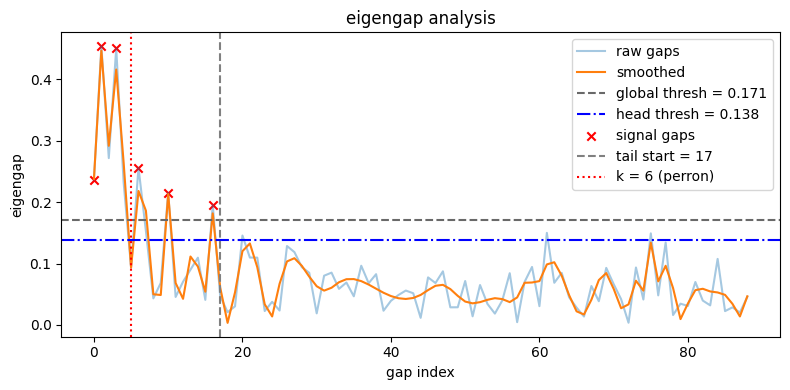

In [249]:
def find_strong_peaks(head_gaps, prominence=0.01, alpha=0.1):
    if len(head_gaps) == 0:
        return np.array([], dtype=int), None
    peaks, props = find_peaks(head_gaps, prominence=prominence)
    min_thresh = np.median(head_gaps) + alpha * np.std(head_gaps)
    strong_peaks = [p for p in peaks if head_gaps[p] > min_thresh]
    if head_gaps[0] > min_thresh and 0 not in strong_peaks:
        strong_peaks = [0] + strong_peaks
    return np.unique(strong_peaks), min_thresh

def try_dominant_candidate(head_gaps, evecs, dom_idx, tail_start):
    # test whether a single gap is dominant
    k_dom = dom_idx + 1
    if k_dom > evecs.shape[1]:
        return None
    dom_gap = head_gaps[dom_idx]
    rest = np.delete(head_gaps, dom_idx)
    mean_gap = rest.mean() if rest.size else 1e-9
    std_gap = rest.std() if rest.size else 1e-9
    next_gap = np.partition(head_gaps, -2)[-2] if len(head_gaps) > 1 else 1e-9

    dominant_conditions = [
        lambda: dom_gap / (mean_gap + 1e-9) >= 1.2,
        lambda: dom_gap / (np.median(head_gaps) + 1e-9) >= 1.2,
        lambda: dom_gap / (next_gap + 1e-9) >= 1.3,
        lambda: (dom_gap - mean_gap) / (std_gap + 1e-9) >= 2,
        lambda: dom_gap > np.median(head_gaps) + np.std(head_gaps),
    ]
    for cond in dominant_conditions:
        if rest.size and std_gap > 0 and cond():
            x_dom = normalize(evecs[:, :k_dom])
            labels_dom = KMeans(n_clusters=k_dom, n_init=10, random_state=42).fit_predict(x_dom)
            sil_dom = silhouette_score(x_dom, labels_dom) if k_dom > 1 else -1
            score_dom = sil_dom + 1 / (1 + abs(k_dom - tail_start) + 1e-6)
            return {
                'k': k_dom,
                'mode': 'dom',
                'eigengap': dom_gap,
                'silhouette': sil_dom,
                'score': score_dom,
                'signal_idxs': [dom_idx],
                'embedding_dim': k_dom,
                'head_thresh': None,
                'alpha': None
            }
    return None

def perron_candidates(
    head_gaps, evecs, tail_start,
    prominence=None, alphas=None, min_k=2
):
    if alphas is None:
        alphas = [0.05, 0.15, 0.3, 0.5]
    if prominence is None:
        prominence = 0.01

    candidates = []
    for alpha in alphas:
        peaks, min_thresh = find_strong_peaks(head_gaps, prominence=prominence, alpha=alpha)
        k = len(peaks)
        if k < min_k or k > evecs.shape[1]:
                continue
        x_perron = normalize(evecs[:, :k])
        labels_perron, memberships = fuzzy_cmeans_memberships(x_perron, k)
        sil_perron = compute_silhouette_general(x_perron, labels_perron, memberships)
        score_perron = sil_perron + 1 / (tail_start + 1e-6)
        candidates.append({
                'k': k,
                'mode': 'perron',
                'eigengap': np.median(head_gaps[peaks]) if len(peaks) else 0,
                'silhouette': sil_perron,
                'score': score_perron,
                'signal_idxs': list(peaks),
                'embedding_dim': k,
                'head_thresh': min_thresh,
                'alpha': alpha,
                'prominence': prominence,
                'memberships': memberships,
                'labels': labels_perron,
            })
    return candidates

def fallback_candidate(head_gaps, evecs, tail_start, global_thresh):
    # fallback: all gaps above global thresh in the head
    signal_idxs = [i for i, gap in enumerate(head_gaps) if gap >= global_thresh]
    k = len(signal_idxs) if signal_idxs else 2
    if k<2:
        k=2
    if k > evecs.shape[1]:
        k = evecs.shape[1]
    x_fallback = normalize(evecs[:, :k])
    labels_fb, memberships = fuzzy_cmeans_memberships(x_fallback, k)
    sil_fb = compute_silhouette_general(x_fallback, labels_fb, memberships)
    score_fb = sil_fb + 1 / (1 + abs(k - tail_start) + 1e-6)
    return {
        'k': k,
        'mode': 'fallback',
        'eigengap': head_gaps[signal_idxs[0]] if signal_idxs else (head_gaps[0] if len(head_gaps) else 0),
        'silhouette': sil_fb,
        'score': score_fb,
        'signal_idxs': signal_idxs if signal_idxs else [0],
        'embedding_dim': k,
        'head_thresh': global_thresh,
        'alpha': None,
        'memberships': memberships,
        'labels': labels_fb,
    }

def optimize_k_signless(
    G, k_frac=0.75, smooth=0.05, min_sil=0.2, prominence=0.05
):
    Q = compute_signless_laplacian(G)
    n = G.number_of_nodes()
    k_eig = max(2, int(n * k_frac))
    evals, evecs = eigsh(Q, k=k_eig, which='LM', v0=np.ones(n), tol=1e-6)
    idx = np.argsort(evals)[::-1]
    evals, evecs = evals[idx], evecs[:, idx]
    _, gaps, smoothed = analyze_eigengap_spectrum(evals, smooth=smooth)
    global_thresh = np.median(smoothed) + 1.5 * np.std(smoothed)
    tail_start = find_tail_start(smoothed, global_thresh)
    head_gaps = gaps[:tail_start+1]
    candidates = []

    # 1. try unique dominant peak
    dom_peaks, min_thresh = find_strong_peaks(head_gaps, prominence=prominence, alpha=0.15)
    if len(dom_peaks) == 1:
        dom_idx = dom_peaks[0]
        dom_candidate = try_dominant_candidate(head_gaps, evecs, dom_idx, tail_start)
        if dom_candidate is not None and dom_candidate['silhouette'] >= min_sil:
            candidates.append(dom_candidate)
    else:
        # 2. else try all perron candidates (multi-peaks)
        perron = perron_candidates(head_gaps, evecs, tail_start, prominence=None, alphas=None, min_k=2)
        candidates.extend([c for c in perron if c['silhouette'] >= min_sil])

    # 3. fallback if none
    if not candidates:
        candidates.append(fallback_candidate(head_gaps, evecs, tail_start, global_thresh))
    best = max(candidates, key=lambda c: c['score'], default=None)
    return best, candidates, evals, evecs, gaps, smoothed, tail_start, global_thresh

# analysis loop
results = []
for G in graphs:
    print(f"\nProcessing graph:")
    best, candidates, evals, evecs, gaps, smoothed, tail_start, global_thresh = optimize_k_signless(G)

    if not candidates:
        print("  No candidates were found (even after fallback).")
    else:
        print(f"  Candidates tested (mode, k, eigengap, silhouette, score):")
        for c in candidates:
            print(f"    mode: {c['mode']}, k: {c['k']}, gap: {c['eigengap']:.3f}, "
                  f"sil: {c['silhouette']:.3f}, score: {c['score']:.3f}")

    if best is None:
        print("  No suitable stable candidate found.")
        plot_gap_analysis(
            evals, gaps, smoothed, tail_start, global_thresh, None,
            signal_idxs=None, mode=None, thresh=None
        )
        continue

    name = getattr(G, 'name', 'Graph')
    name = name[0].upper() + name[1:] if name else 'Graph'
    head_thresh = best.get('head_thresh')
    alpha = best.get('alpha')
    head_thresh_str = f"{head_thresh:.3f}" if head_thresh is not None else "None"
    alpha_str = f"{alpha:.3f}" if alpha is not None else "None"
    print(f"\n  Best with mode={best['mode']}, k={best['k']}, "
          f"silhouette={best['silhouette']:.3f} "
          f"score={best['score']:.3f}, head_thresh={head_thresh_str}, alpha={alpha_str}")

    signal_idxs = best.get('signal_idxs')
    plot_gap_analysis(
        evals, gaps, smoothed, tail_start, global_thresh, best['k'],
        signal_idxs=signal_idxs, mode=best['mode'], thresh=head_thresh
    )

    results.append({
        'graph': G,
        'best': best,
        'candidates': candidates,
        'evals': evals,
        'evecs': evecs,
        'gaps': gaps,
        'smoothed': smoothed,
        'tail_start': tail_start,
        'global_thresh': global_thresh
    })


In [250]:
import matplotlib.cm as cm
from scipy.spatial.distance import euclidean

def get_color_vector(node_order, label_dict, cmap_name='tab20'):
    cmap = cm.get_cmap(cmap_name, max(label_dict.values()) + 1)
    return [cmap(label_dict[node]) if node in label_dict else "lightgray" for node in node_order]

def cluster_aware_layout(G, memberships=None, labels=None, scale=1.0, weight_factor=1.0, sigma=0.5,seed=42):
    H = nx.Graph()
    nodes = list(G.nodes())
    node_idx = {n: i for i, n in enumerate(nodes)}

    for u, v in G.edges:
        if memberships is not None:
            dist = euclidean(memberships[node_idx[u]], memberships[node_idx[v]])
            sim = np.exp(-dist**2 / (2 * sigma**2)) 
            weight = weight_factor * sim
        elif labels is not None:
            weight = weight_factor if labels[u] == labels[v] else 0.1
        else:
            weight = 1.0
        H.add_edge(u, v, weight=weight)

    pos = nx.spring_layout(H, weight='weight', scale=scale, seed=seed)
    return pos

import matplotlib.colors as mcolors

def draw_graph_with_labels(G, labels, memberships=None, title=None, pos=None):
    if pos is None:
        if memberships is not None:
            print("Using memberships for layout")
            pos = cluster_aware_layout(G, memberships=memberships, scale=1.0, weight_factor=1, seed=42)
        else:
            print("Using labels for layout")
            pos = cluster_aware_layout(G, labels=labels, scale=1.0, weight_factor=1, seed=42)
    cluster_ids = list(set(labels.values()))
    colors = plt.get_cmap('tab20')(np.linspace(0, 1, len(cluster_ids)))
    color_map = {cid: colors[i] for i, cid in enumerate(cluster_ids)}

    plt.figure(figsize=(10, 8))
    for cid in cluster_ids:
        nodes = [n for n, l in labels.items() if l == cid]
        nx.draw_networkx_nodes(G, pos,
            nodelist=nodes,
            node_color=[color_map[cid]],
            label=f'cluster {cid+1}',
            node_size=200,
            alpha=0.95
        )
    intra_edges = []
    inter_edges = []
    for u, v in G.edges():
        if labels[u] == labels[v]:
            intra_edges.append((u, v))
        else:
            inter_edges.append((u, v))
    if intra_edges:
        nx.draw_networkx_edges(
            G, pos, edgelist=intra_edges,
            edge_color="dimgray", style="solid", alpha=0.7, width=2
        )
    if inter_edges:
        nx.draw_networkx_edges(
            G, pos, edgelist=inter_edges,
            edge_color="lightgray", style="dotted", alpha=0.8, width=2
        )

    nx.draw_networkx_labels(G, pos, font_size=8, font_color="black")

    plt.title(title or "Clustered graph")
    plt.axis('off')
    plt.legend(loc='lower right')
    plt.tight_layout()
    plt.show()

Clustering : mode=fallback, k=3, silhouette=0.6050, inertia=12.92
Using labels for layout


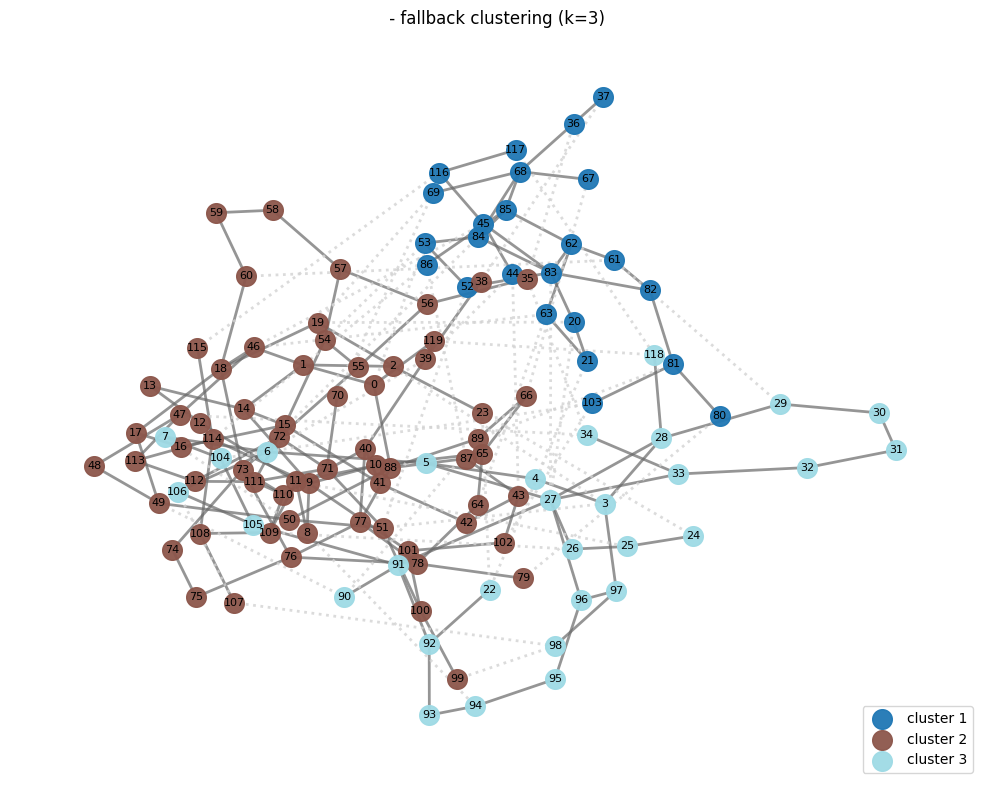

Clustering : mode=perron, k=5, silhouette=0.4243, inertia=30.88
Using memberships for layout


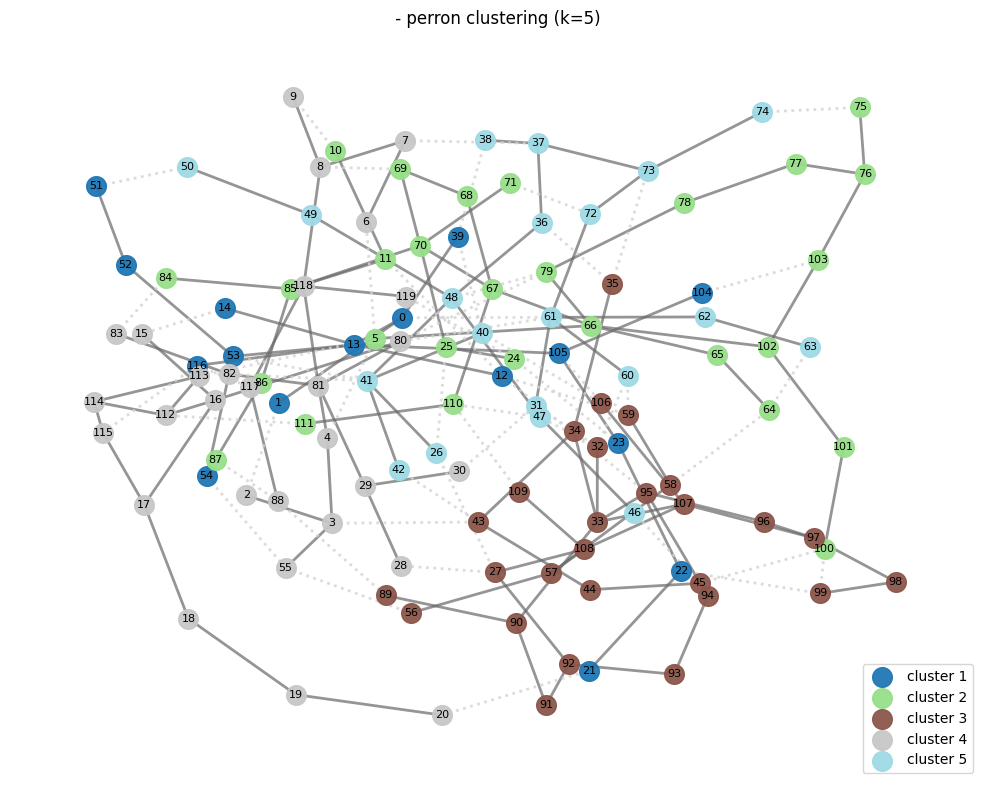

Clustering : mode=perron, k=3, silhouette=0.4054, inertia=32.69
Using memberships for layout


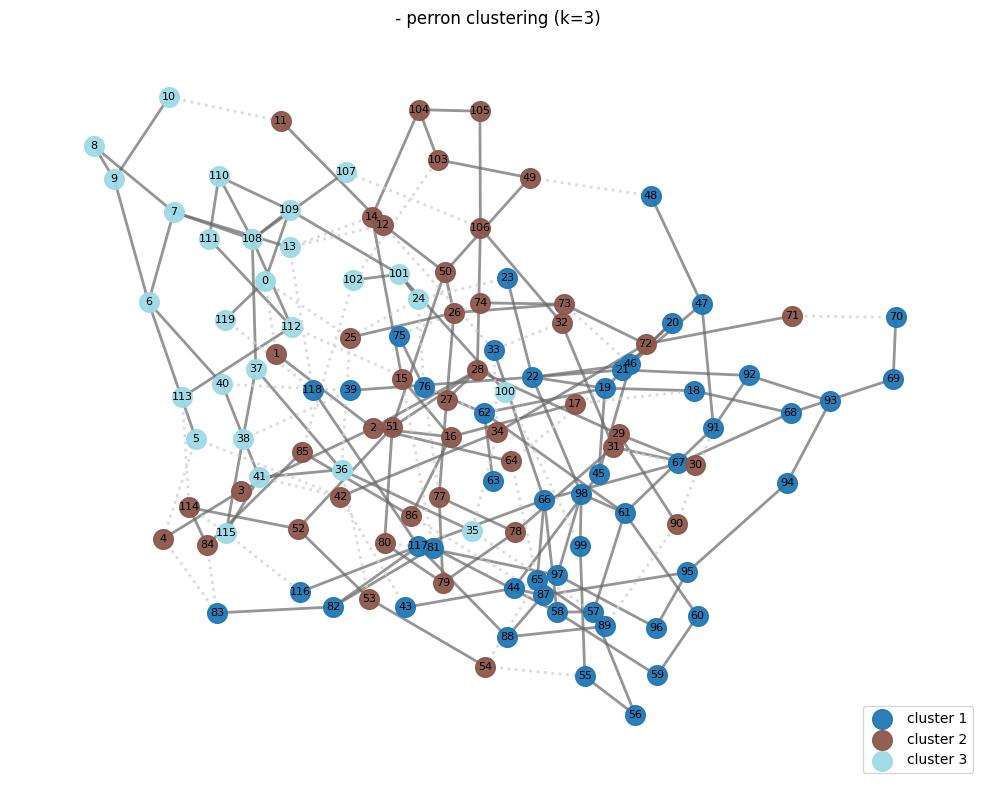

Clustering : mode=perron, k=6, silhouette=0.3717, inertia=35.86
Using memberships for layout


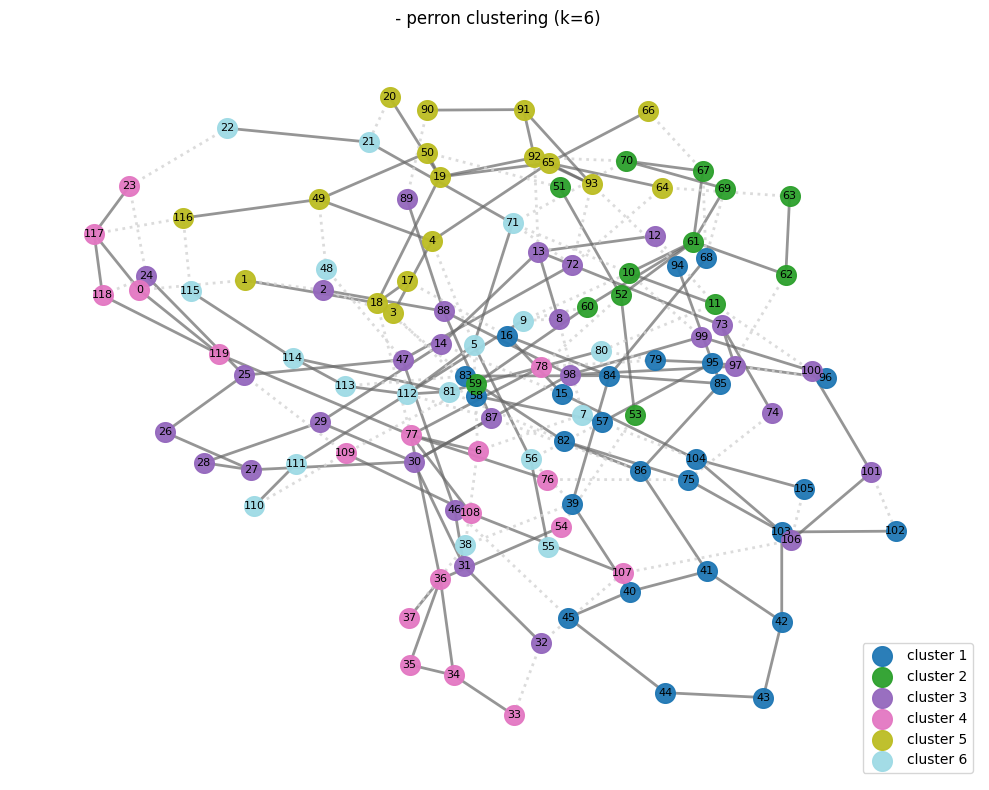

In [251]:
from scipy.spatial.distance import euclidean

def spectral_cluster_signless(evecs, k, normalize_rows=True):
    X = evecs[:, :k].copy()
    if normalize_rows:
        X = normalize(X)
    km = KMeans(n_clusters=k, n_init=10, random_state=42, init='k-means++')
    labels = km.fit_predict(X)
    sil_score = silhouette_score(X, labels) if k > 1 else None
    inertia = km.inertia_
    return labels, sil_score, inertia

def cluster_perron_embedding(result):
    k = result['k']
    if k < 1:
        return None, None, None, None
    evecs = result['evecs'][:, :k+ 1]
    X = normalize(evecs)
    km = KMeans(n_clusters=k, n_init=10, random_state=42, init='k-means++')
    distances = km.fit_transform(X)
    

    memberships = np.exp(-distances)
    memberships /= memberships.sum(axis=1, keepdims=True)
    
    labels = np.argmax(memberships, axis=1)
    sil_score = silhouette_score(X, labels) if k > 1 else None
    inertia = km.inertia_
    return memberships, labels, sil_score, inertia


cluster_results_signless = []

for result in results:
    G = result['graph']
    evecs = result['evecs']
    best = result['best']
    if best is None:
        print(f"No valid best candidate for {G.name if hasattr(G, 'name') else 'graph'}")
        continue

    k = best['k']
    mode = best['mode']

    memberships, labels, sil, inertia = None, None, None, None
    if mode.startswith('perron'):
        # Use best as argument; best should have tail_start, evecs, etc.
        memberships, labels, sil, inertia = cluster_perron_embedding({
            'k': k,
            'tail_start': best['embedding_dim'] - 1,  # tail_start+1 = embedding_dim
            'evecs': evecs
        })
        X = normalize(evecs[:, :best['embedding_dim']])
    else:
        labels, sil, inertia = spectral_cluster_signless(evecs, k)
        X = normalize(evecs[:, :k])

    cluster_results_signless.append({
        'graph': G,
        'k': k,
        'mode': mode,
        'labels': labels,
        'memberships': memberships,
        'silhouette': sil,
        'inertia': inertia
    })
    print(f"Clustering {G.name if hasattr(G, 'name') else 'graph'}: mode={mode}, k={k}, silhouette={sil:.4f}, inertia={inertia:.2f}")
    if memberships is not None:
        draw_graph_with_labels(
            G, labels=dict(zip(G.nodes(), labels)), memberships=memberships,
            title=f"{G.name if hasattr(G, 'name') else 'graph'} - {mode} clustering (k={k})"
        )
    else:
        draw_graph_with_labels(
            G, labels=dict(zip(G.nodes(), labels)),
            title=f"{G.name if hasattr(G, 'name') else 'graph'} - {mode} clustering (k={k})"
        )

Using labels for layout


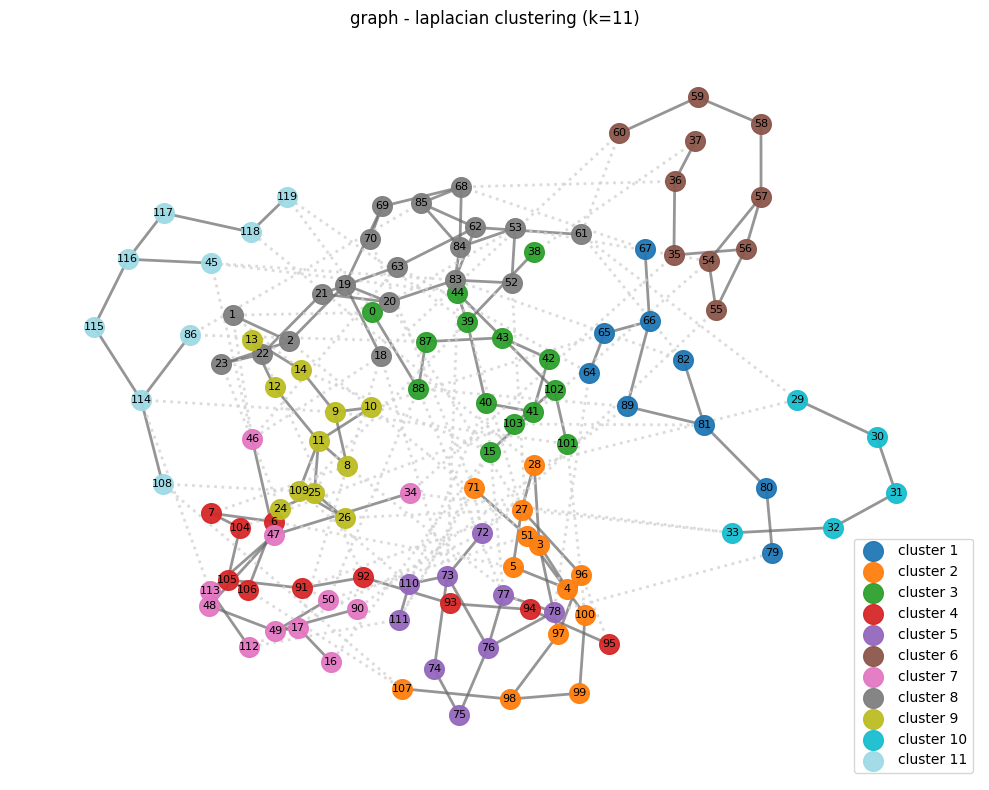

Using labels for layout


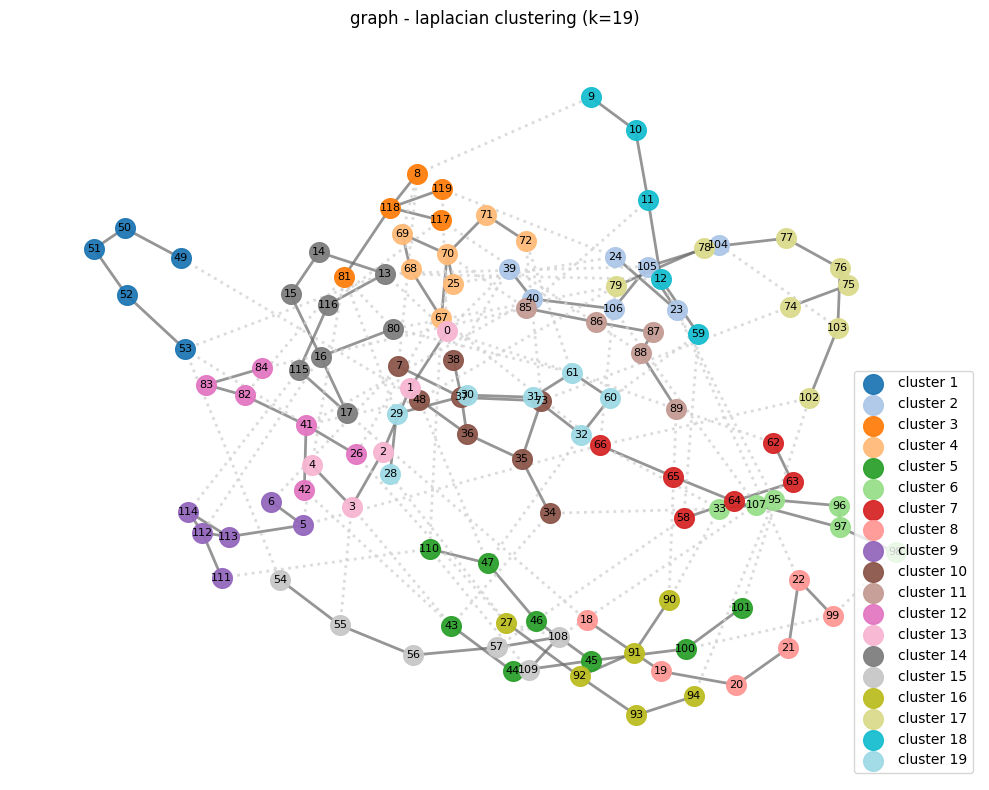

Using labels for layout


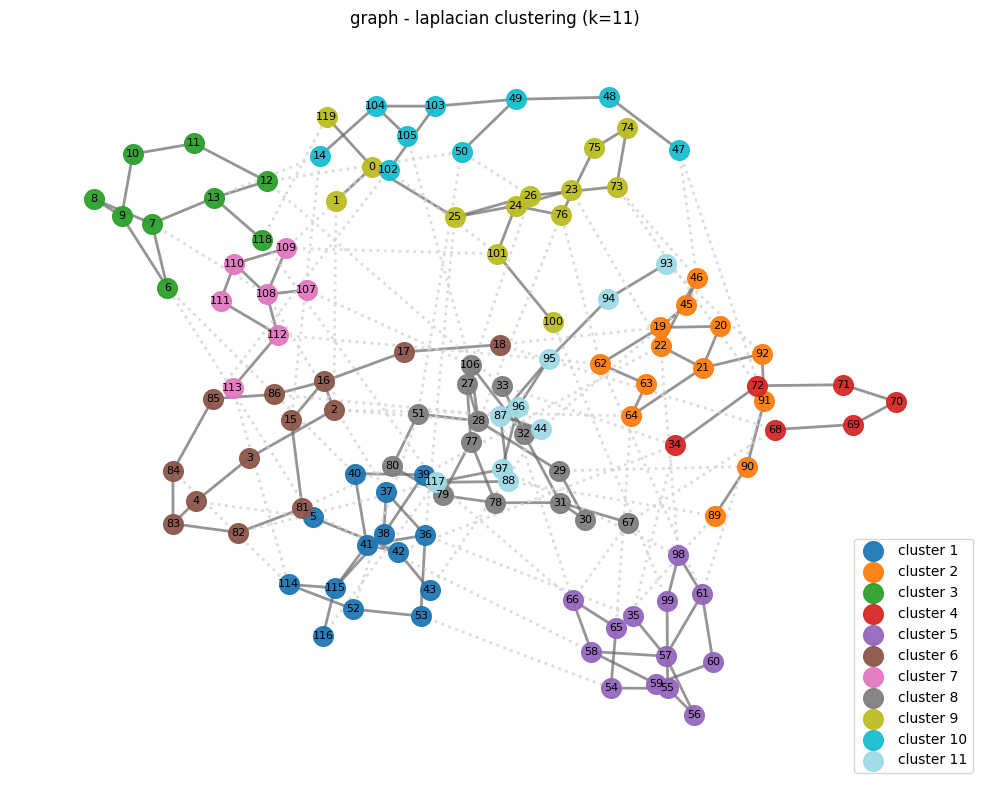

Using labels for layout


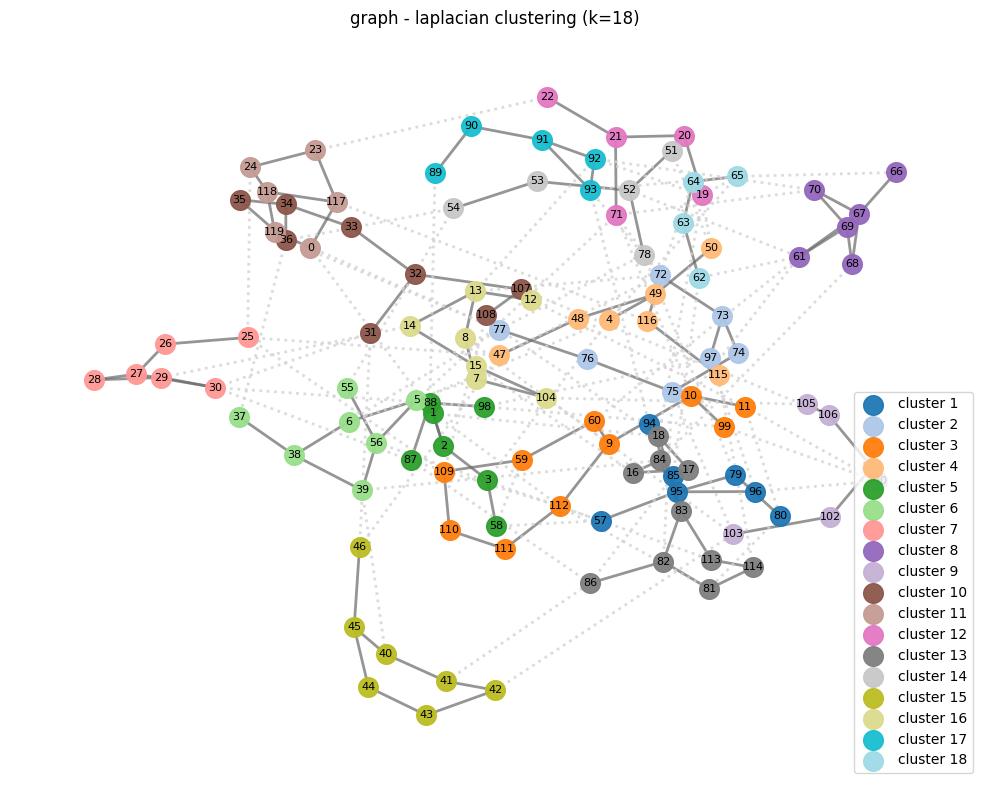

In [252]:
def cluster_laplacian_embeddings(laplacian_data, normalize_rows=True):
    clustered = []
    for i, item in enumerate(laplacian_data):
        if not isinstance(item, dict):
            print(f"WARNING: Skipping non-dict entry at index {i}: {item}")
            continue
        G = item.get('graph')
        best = item.get('best', None)
        if not best or best.get('k', None) is None or best['k'] < 1:
            clustered.append({'graph': G, 'k': None, 'labels': None, 'silhouette': None})
            continue

        k = best['k']
        evecs = item['evecs']
        X = evecs[:, 1:k+1] if evecs.shape[1] > k else evecs

        if normalize_rows:
            X = normalize_rows_fn(X)

        model = KMeans(n_clusters=k, n_init=10, random_state=42)
        labels = model.fit_predict(X)
        sil = silhouette_score(X, labels) if k > 1 else None

        clustered.append({
            'graph': G,
            'k': k,
            'labels': dict(zip(G.nodes(), labels)),
            'silhouette': sil
        })
    return clustered


def normalize_rows_fn(x):
    nrm = np.linalg.norm(x, axis=1, keepdims=True)
    nrm[nrm == 0] = 1
    return x / nrm

clustered_laplacian_results = cluster_laplacian_embeddings(laplacian_data)

for res in clustered_laplacian_results:
    G = res['graph']
    labels = res['labels']
    k = res['k']
    if labels is None or k is None or k < 1:
        print(f"skipping {G.name if hasattr(G, 'name') else 'graph'}: no clustering")
        continue
    title = f"{G.name if hasattr(G, 'name') and G.name else 'graph'} - laplacian clustering (k={k})"
    draw_graph_with_labels(G, labels=labels, title=title)

/var/folders/8p/_chtsr094z32zkn82wyl40600000gn/T/ipykernel_6221/2840633877.py:51: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_lap = cm.get_cmap('tab20', len(lap_clusters))
/var/folders/8p/_chtsr094z32zkn82wyl40600000gn/T/ipykernel_6221/2840633877.py:52: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_sig = cm.get_cmap('Pastel1', len(sig_clusters))


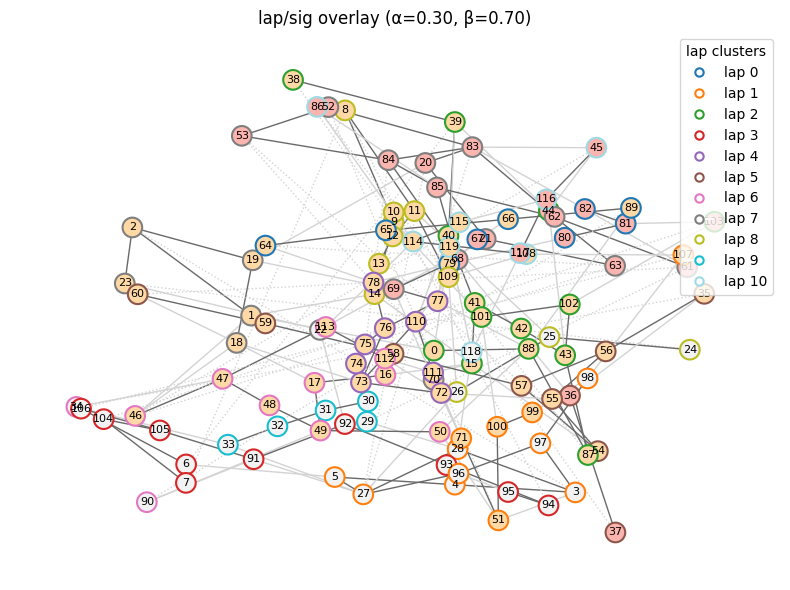

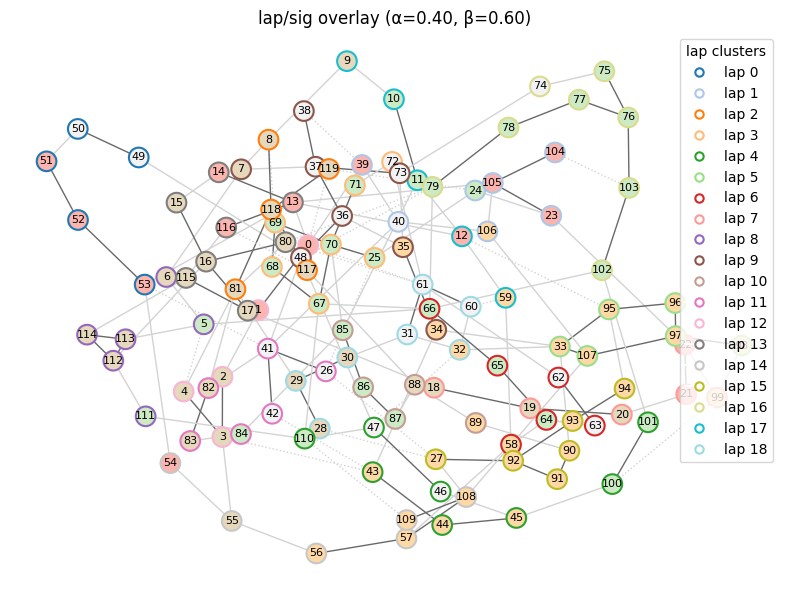

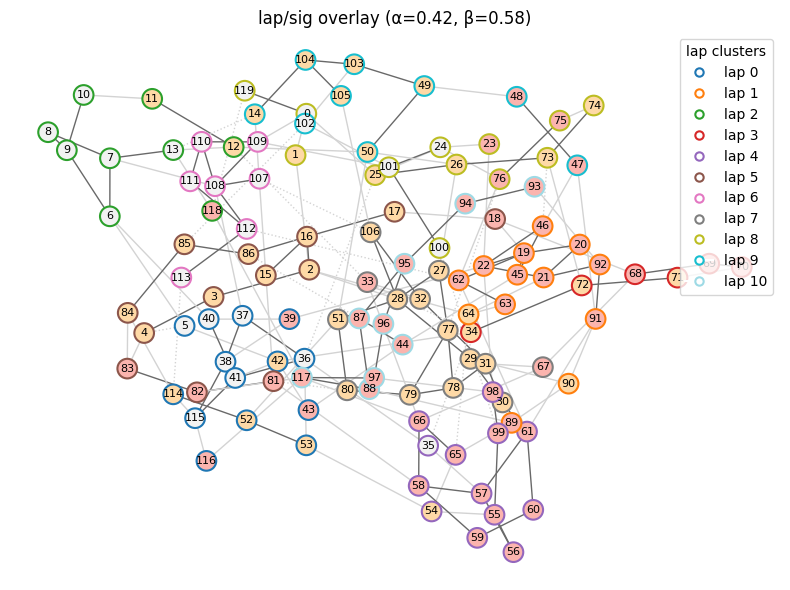

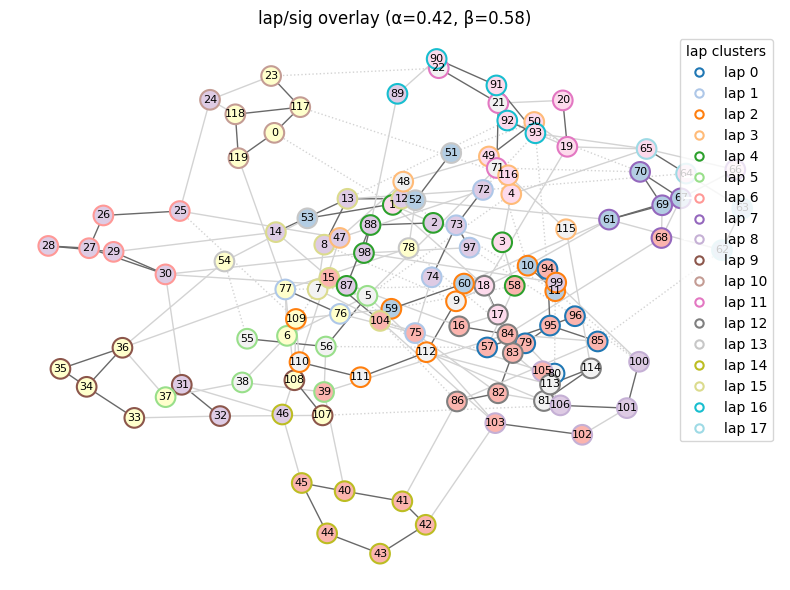

In [294]:
def compute_edge_agreement_weights(G, lap_res, signless_res, alpha=0.5, beta=0.5):
    lap_labels = lap_res['labels']
    sig_labels = signless_res['labels']
    memberships = signless_res.get('memberships')
    edge_weights = {}

    if memberships is not None:
        node_list = list(G.nodes())
        node_to_idx = {node: i for i, node in enumerate(node_list)}

    for u, v in G.edges():
        w_lap = 1 if lap_labels[u] == lap_labels[v] else 0

        if memberships is not None:
            i_u = node_to_idx[u]
            i_v = node_to_idx[v]
            p_u = memberships[i_u]
            p_v = memberships[i_v]
            w_sign = np.dot(p_u, p_v)
        else:
            w_sign = 1 if sig_labels[u] == sig_labels[v] else 0
        if w_lap ==0 and w_sign ==0:
            edge_weights[(u, v)]=-0.2
        else:  
            edge_weights[(u, v)] = alpha * w_lap + beta * w_sign


    return edge_weights


def build_layout(G, lap_res, signless_res, alpha=0.5, beta=0.5, seed=42):
    ew = compute_edge_agreement_weights(G, lap_res, signless_res, alpha, beta)
    H = nx.Graph()
    for u, v in G.edges():
        H.add_edge(u, v, weight=ew[(u, v)])
    return nx.spring_layout(H, weight='weight', seed=seed), ew

def draw_dual_colored_graph(G, lap_res, sig_res, alpha=0.5, beta=0.5, title='lap/sig overlay', figsize=(8, 6)):
    pos, ew = build_layout(G, lap_res, sig_res, alpha, beta)
    nodes = list(G.nodes())

    lap_labels = lap_res['labels']
    sig_labels = sig_res['labels']

    get_lap = (lambda n: lap_labels[n]) if not isinstance(lap_labels, dict) else (lambda n: lap_labels.get(n, -1))
    get_sig = (lambda n: sig_labels[n]) if not isinstance(sig_labels, dict) else (lambda n: sig_labels.get(n, -1))

    lap_clusters = sorted(set(get_lap(n) for n in nodes))
    sig_clusters = sorted(set(get_sig(n) for n in nodes))

    cmap_lap = cm.get_cmap('tab20', len(lap_clusters))
    cmap_sig = cm.get_cmap('Pastel1', len(sig_clusters))

    lap_colors = {c: cmap_lap(i) for i, c in enumerate(lap_clusters)}
    sig_colors = {c: cmap_sig(i) for i, c in enumerate(sig_clusters)}

    node_colors = [sig_colors.get(get_sig(n), "lightgray") for n in nodes]
    node_borders = [lap_colors.get(get_lap(n), "gray") for n in nodes]

    edge_colors = []
    edge_styles = []

    for u, v in G.edges():
        same_lap = get_lap(u) == get_lap(v)
        same_sig = get_sig(u) == get_sig(v)

        if same_lap and same_sig:
            color = 'dimgray'
            style = 'solid'
        elif same_lap or same_sig:
            color = 'lightgray'
            style = 'solid'
        else:
            color = 'lightgray'
            style = 'dotted'

        if G[u][v].get('contracted'):
            color = 'black'
            style = 'solid'

        edge_colors.append(color)
        edge_styles.append(style)

    fig, ax = plt.subplots(figsize=figsize)

    for (u, v), color, style in zip(G.edges(), edge_colors, edge_styles):
        nx.draw_networkx_edges(G, pos, edgelist=[(u, v)], ax=ax, edge_color=color, style=style)

    nx.draw_networkx_nodes(
        G, pos, ax=ax,
        node_color=node_colors,
        edgecolors=node_borders,
        linewidths=1.5, node_size=200
    )
    nx.draw_networkx_labels(G, pos, font_size=8, ax=ax)

    handles = [
        plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='white',
                   markeredgecolor=lap_colors[c], markeredgewidth=1.5, label=f'lap {c}')
        for c in lap_clusters
    ]
    ax.legend(handles=handles, loc='upper right', title='lap clusters')
    ax.set_title(title)
    ax.axis('off')
    plt.tight_layout()
    plt.show()
    return ew

def compute_alpha_beta(sil_lap, sil_signless):
    sil_lap = 0.0 if sil_lap is None else sil_lap
    sil_signless = 0.0 if sil_signless is None else sil_signless
    total = sil_lap + sil_signless
    if total == 0:
        return 0.5, 0.5
    a = sil_lap / total
    b = sil_signless / total
    return a, b

# main loop
for lap_res, sq_res in zip(clustered_laplacian_results, cluster_results_signless):
    sil_lap = lap_res['silhouette']
    sil_sign = sq_res.get('silhouette')
    a, b = compute_alpha_beta(sil_lap, sil_sign)
    G = lap_res['graph']
    ew = draw_dual_colored_graph(
        G,
        lap_res,
        sq_res,
        alpha=a,
        beta=b,
        title=f"lap/sig overlay (α={a:.2f}, β={b:.2f})"
    )

In [292]:
def laplacian_clustering_pipeline(
    G,
    contracted_edges=None,
    method='median',
    prominence=0.01,
    thresh_factor=0.5,
    min_window=10,
    sample_size=100,
    noise_level=0.01,
    repeats=5,
    plot=False
):
    L = compute_laplacian(G, normalized=True)
    evals, evecs = np.linalg.eigh(L.toarray())
    gaps = np.diff(evals)
    best, candidates = spectral_k_pipeline(
        L, evals, evecs, gaps, prominence=prominence, thresh_factor=thresh_factor, min_window=min_window, 
        sample_size=sample_size, noise_level=noise_level, repeats=repeats
    )
    name = getattr(G, 'name', 'graph')
    k = best['k'] if best and best.get('k', None) else None

    if k and k >= 1:
        X = evecs[:, 1:k+1]
        X = normalize(X)
        km = KMeans(n_clusters=k, n_init=10, random_state=42)
        labels = km.fit_predict(X)
        label_dict = dict(zip(G.nodes(), labels))
        if contracted_edges:
            parent = {n: n for n in G.nodes()}
            def find(u):
                while parent[u] != u:
                    parent[u] = parent[parent[u]]
                    u = parent[u]
                return u
            def union(u, v):
                pu, pv = find(u), find(v)
                if pu != pv:
                    parent[pu] = pv
            for u, v in contracted_edges:
                if u in parent and v in parent:
                    union(u, v)
            comp_to_label = {}
            for n in G.nodes():
                p = find(n)
                if p not in comp_to_label:
                    comp_to_label[p] = label_dict[n]
                label_dict[n] = comp_to_label[p]
        sil = silhouette_score(X, list(label_dict.values())) if k > 1 else None
    else:
        label_dict = None
        sil = None

    if plot:
        if k and k >= 1:
            print(f"best k: {k} (method: {best.get('type', 'unknown')} above thresh for {best.get('dim', '?')} dimensions)")
            plot_eigengap(gaps, k=k, cutoff_t=best.get('dim', None), threshold=best.get('threshold', None))
            if label_dict:
                draw_graph_with_labels(G, labels=label_dict, title=f"Laplacian clustering (k={k})")
        else:
            print(f"[{name}] no good k found.")
            plot_eigengap(gaps, cutoff_t=None, threshold=None)

    return {
        'graph': G,
        'laplacian': L,
        'evals': evals,
        'evecs': evecs,
        'gaps': gaps,
        'best': best,
        'candidates': candidates,
        'k': k,
        'labels': label_dict,
        'silhouette': sil
    }


def signless_laplacian_clustering_pipeline(
    G,
    contracted_edges=None,
    k_frac=0.75,
    smooth=0.01,
    min_sil=0.1,
    min_stability=0.4,
    noise_level=0.01,
    repeats=5,
    prominence=0.05,
    plot=True
):
    best, candidates, evals, evecs, gaps, smoothed, tail_start, global_thresh = optimize_k_signless(
        G, k_frac=k_frac, smooth=smooth, min_sil=min_sil, prominence=prominence
    )
    k = best['k'] if best and best.get('k', None) else None

    if k and k >= 1:
        X = normalize(evecs[:, :k])
        km = KMeans(n_clusters=k, n_init=10, random_state=42).fit(X)
        labels = km.labels_
        label_dict = dict(zip(G.nodes(), labels))
        if contracted_edges:
            parent = {n: n for n in G.nodes()}
            def find(u):
                while parent[u] != u:
                    parent[u] = parent[parent[u]]
                    u = parent[u]
                return u
            def union(u, v):
                pu, pv = find(u), find(v)
                if pu != pv:
                    parent[pu] = pv
            for u, v in contracted_edges:
                if u in parent and v in parent:
                    union(u, v)
            comp_to_label = {}
            for n in G.nodes():
                p = find(n)
                if p not in comp_to_label:
                    comp_to_label[p] = label_dict[n]
                label_dict[n] = comp_to_label[p]
        memberships = None
        if best.get('mode') == 'perron' and hasattr(km, 'transform'):
            memberships = km.transform(X)
            memberships = np.exp(-memberships)
            memberships /= memberships.sum(axis=1, keepdims=True)
        sil = silhouette_score(X, list(label_dict.values())) if k > 1 else None
    else:
        label_dict = None
        memberships = None
        sil = None

    if plot:
        if k and k >= 1:
            plot_gap_analysis(
                evals, gaps, smoothed, tail_start, global_thresh, k,
                signal_idxs=best.get('signal_idxs', []),
                mode=best.get('mode', None),
                thresh=best.get('head_thresh', None)
            )
            if label_dict:
                draw_graph_with_labels(G, labels=label_dict, title=f"signless Laplacian clustering (k={k}, {best.get('mode')})")
        else:
            print(f"[{getattr(G, 'name', 'graph')}] no good k found.")
            plot_gap_analysis(evals, gaps, smoothed, tail_start, global_thresh, None, signal_idxs=None, mode=None, thresh=None)

    return {
        'graph': G,
        'k': k,
        'labels': label_dict,
        'memberships': memberships,
        'silhouette': sil,
        'best': best,
        'candidates': candidates,
        'evals': evals,
        'evecs': evecs
    }

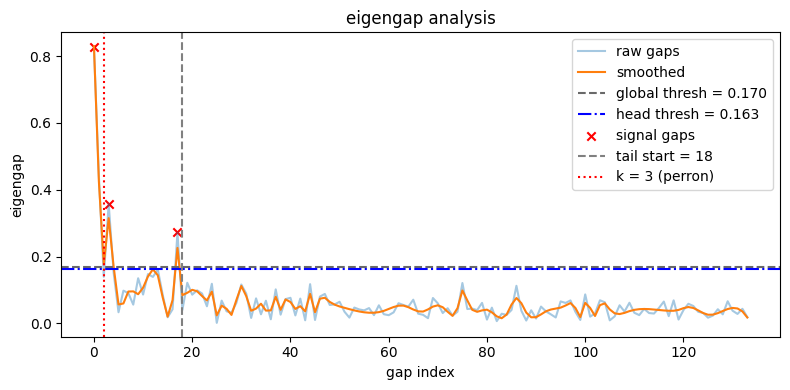

Using labels for layout


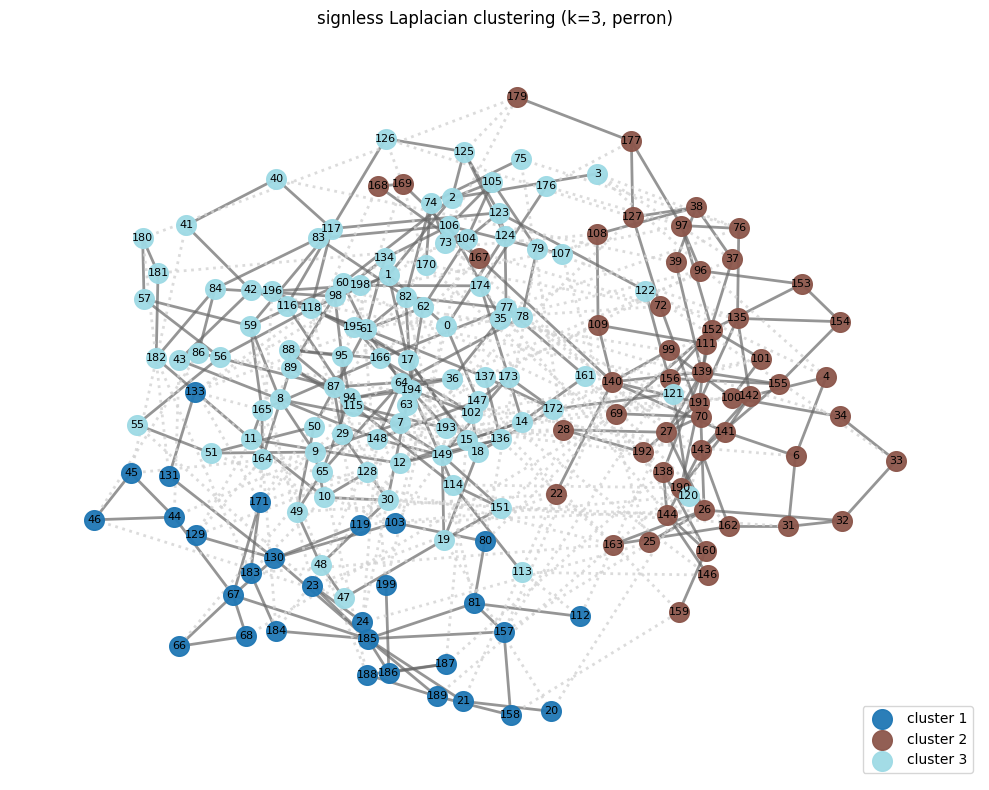

/var/folders/8p/_chtsr094z32zkn82wyl40600000gn/T/ipykernel_6221/3927963531.py:51: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_lap = cm.get_cmap('tab20', len(lap_clusters))
/var/folders/8p/_chtsr094z32zkn82wyl40600000gn/T/ipykernel_6221/3927963531.py:52: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_sig = cm.get_cmap('Pastel1', len(sig_clusters))


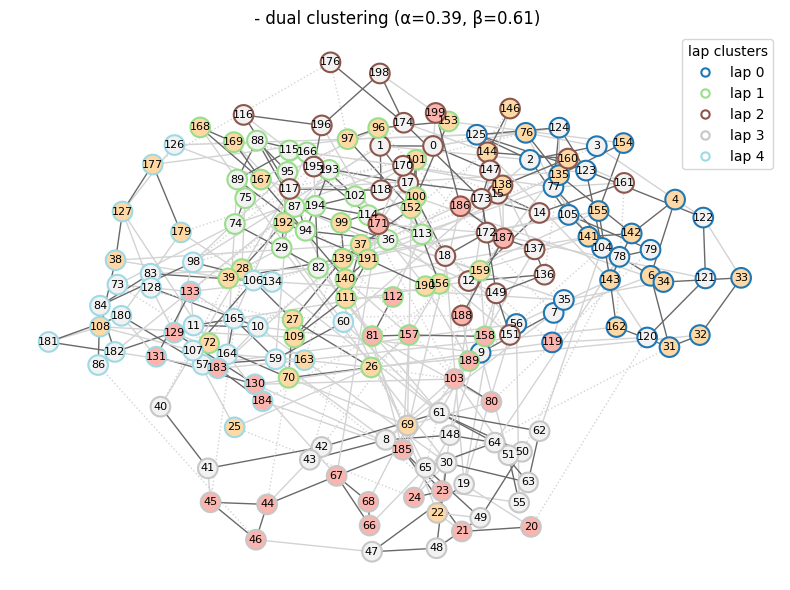

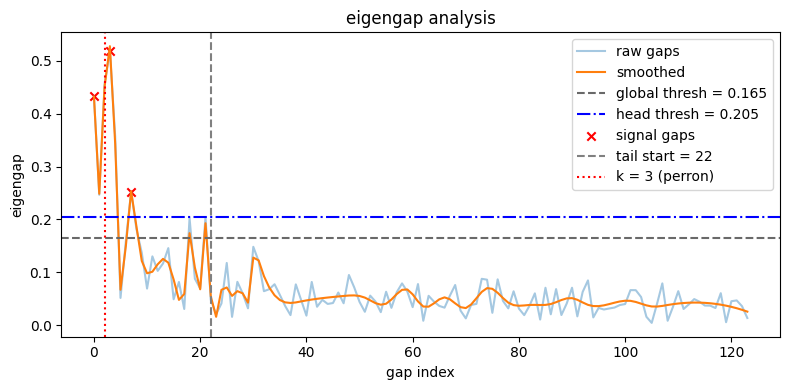

Using labels for layout


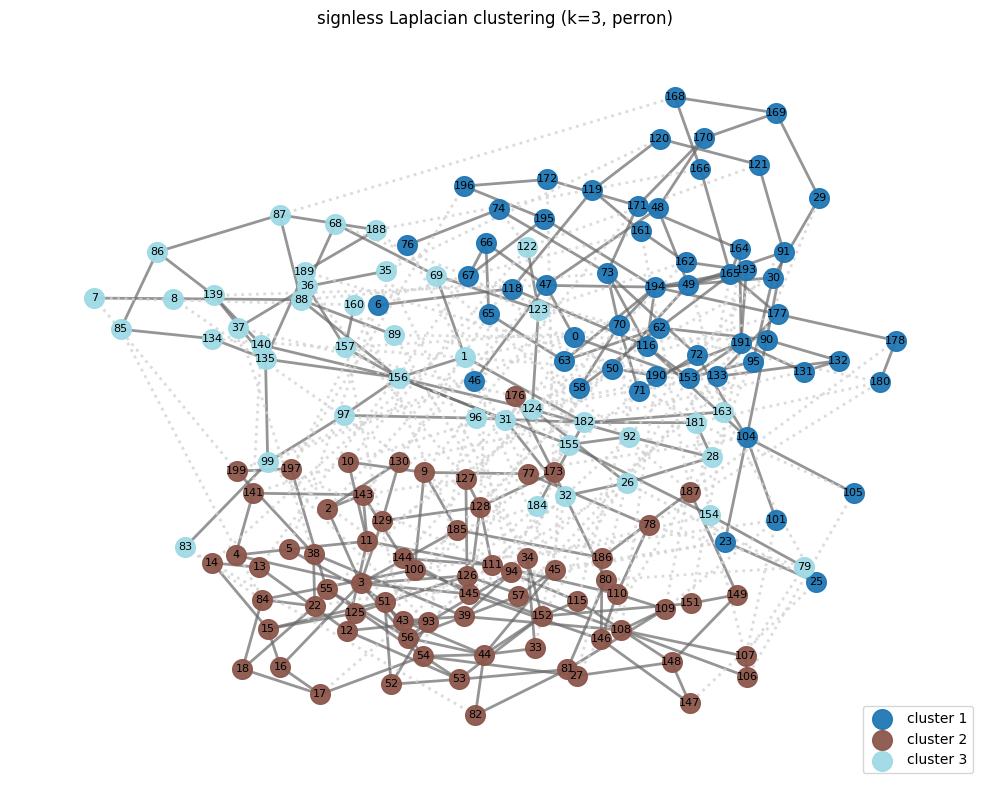

/var/folders/8p/_chtsr094z32zkn82wyl40600000gn/T/ipykernel_6221/3927963531.py:51: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_lap = cm.get_cmap('tab20', len(lap_clusters))
/var/folders/8p/_chtsr094z32zkn82wyl40600000gn/T/ipykernel_6221/3927963531.py:52: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_sig = cm.get_cmap('Pastel1', len(sig_clusters))


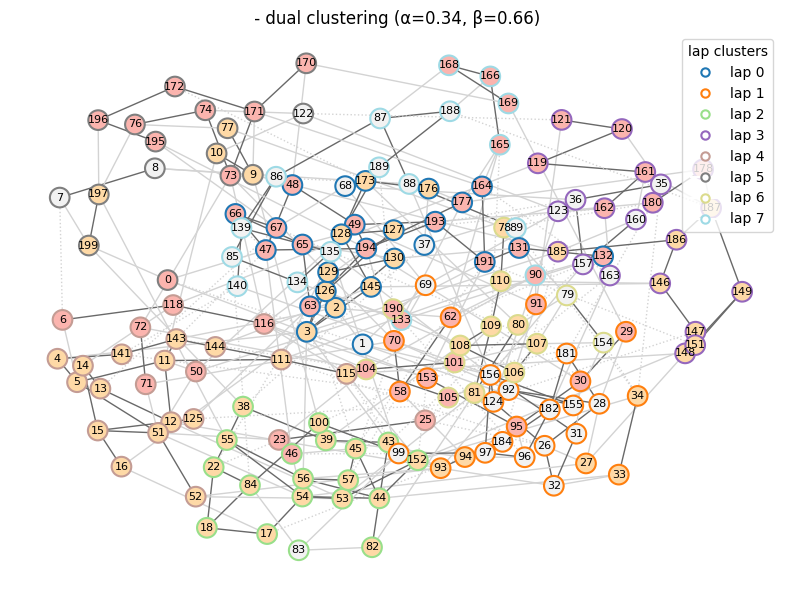

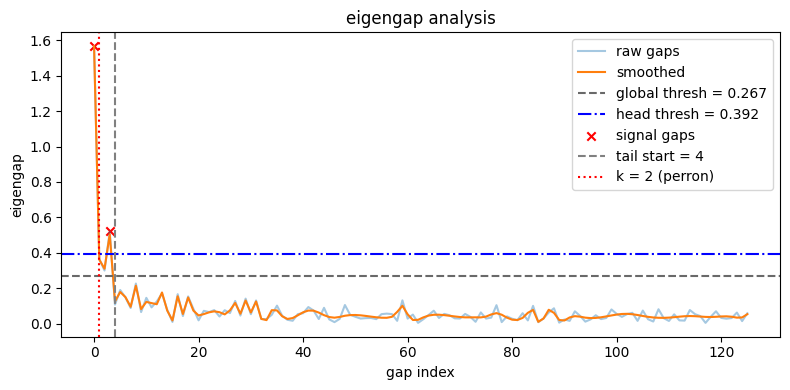

Using labels for layout


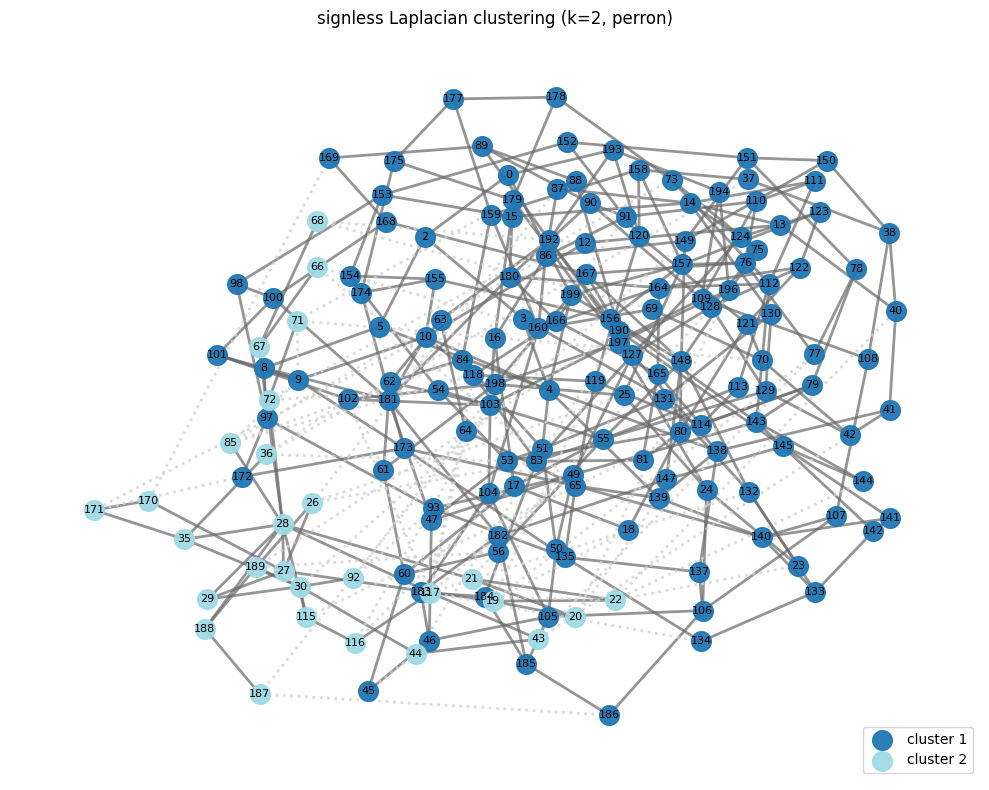

/var/folders/8p/_chtsr094z32zkn82wyl40600000gn/T/ipykernel_6221/3927963531.py:51: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_lap = cm.get_cmap('tab20', len(lap_clusters))
/var/folders/8p/_chtsr094z32zkn82wyl40600000gn/T/ipykernel_6221/3927963531.py:52: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_sig = cm.get_cmap('Pastel1', len(sig_clusters))


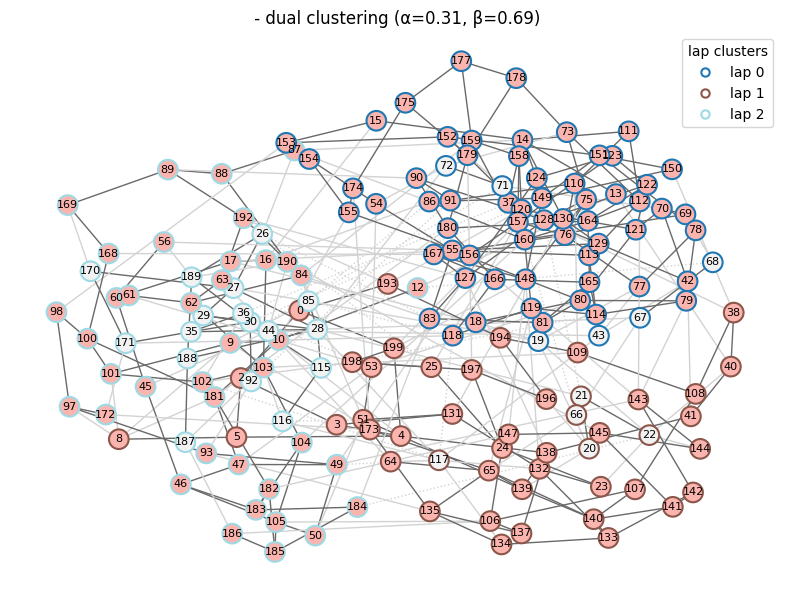

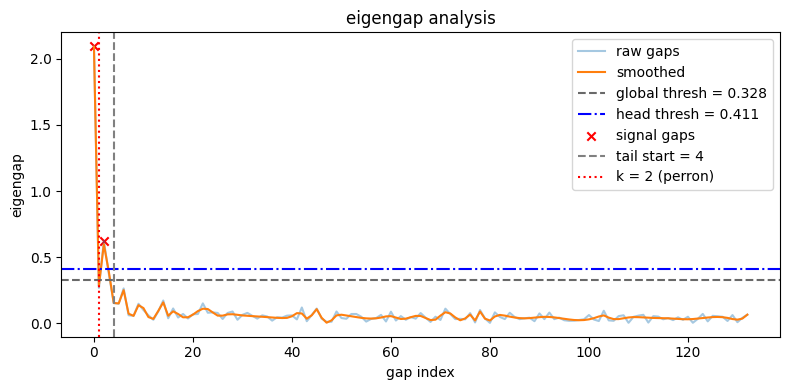

Using labels for layout


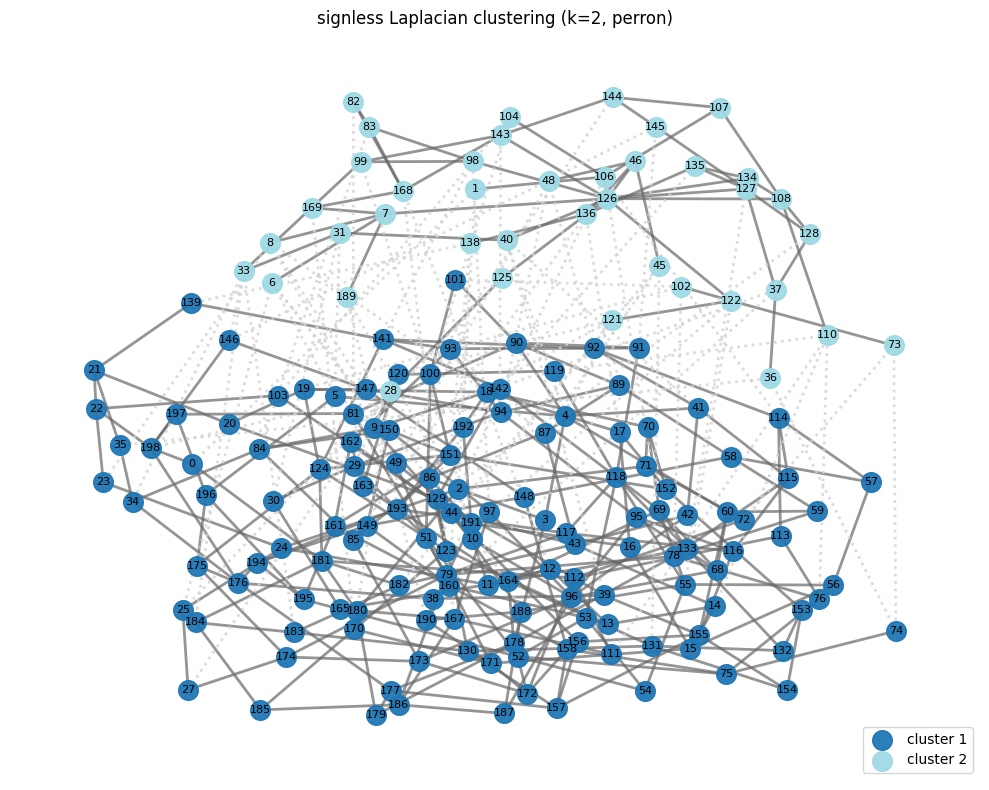

/var/folders/8p/_chtsr094z32zkn82wyl40600000gn/T/ipykernel_6221/3927963531.py:51: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_lap = cm.get_cmap('tab20', len(lap_clusters))
/var/folders/8p/_chtsr094z32zkn82wyl40600000gn/T/ipykernel_6221/3927963531.py:52: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_sig = cm.get_cmap('Pastel1', len(sig_clusters))


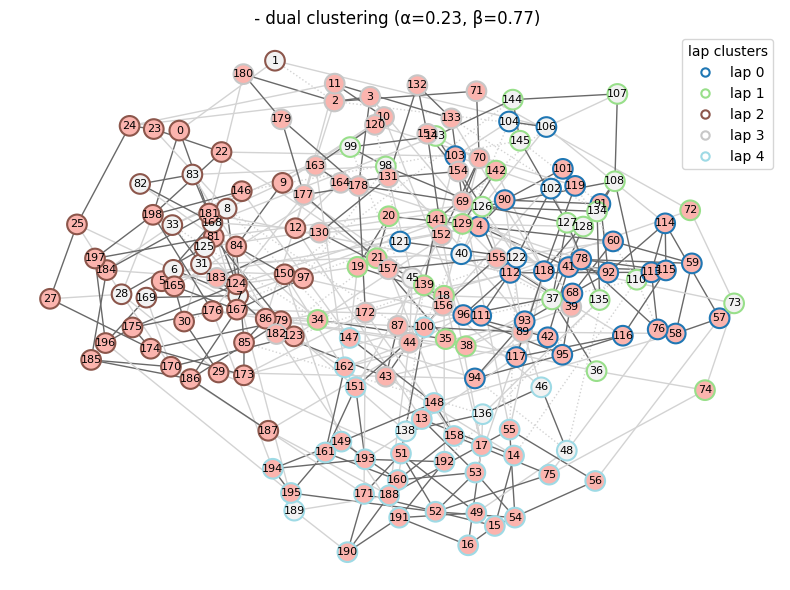

In [293]:
def normalize_key(u, v):
    return tuple(sorted((u, v)))

def contract_degree2_chains(G):
    Gc = G.copy()
    deg2 = [n for n in Gc.nodes() if Gc.degree(n) == 2]
    used = set()
    chains = []
    for n in deg2:
        if n in used or n not in Gc or Gc.degree(n) != 2:
            continue
        left_path = []
        curr, prev = n, None
        while True:
            nbrs = [x for x in Gc.neighbors(curr) if x != prev]
            if prev is not None and (Gc.degree(curr) != 2 or curr in used or len(nbrs) != 1):
                break
            if prev is not None:
                left_path.insert(0, curr)
            if not nbrs:
                break
            prev, curr = curr, nbrs[0]
        left_end = curr
        right_path = []
        curr, prev = n, None
        while True:
            nbrs = [x for x in Gc.neighbors(curr) if x != prev]
            if prev is not None and (Gc.degree(curr) != 2 or curr in used or len(nbrs) != 1):
                break
            if prev is not None:
                right_path.append(curr)
            if not nbrs:
                break
            prev, curr = curr, nbrs[-1]
        right_end = curr
        chain = [left_end] + left_path + [n] + right_path + [right_end]
        if left_end == right_end or Gc.degree(left_end) == 2 or Gc.degree(right_end) == 2:
            continue
        for node in chain:
            used.add(node)
        Gc.add_edge(left_end, right_end)
        for node in chain[1:-1]:
            if node in Gc:
                Gc.remove_node(node)
        chains.append(normalize_key(left_end, right_end))
    return Gc, chains

def clean_ham_cond(G, contracted_edges):
    Gc = G.copy()
    contracted_set = set(normalize_key(*e) for e in contracted_edges)
    for node in list(Gc.nodes()):
        incident_contracted = [nbr for nbr in Gc.neighbors(node) if normalize_key(node, nbr) in contracted_set]
        if len(incident_contracted) == 2:
            for nbr in list(Gc.neighbors(node)):
                if normalize_key(node, nbr) not in contracted_set:
                    Gc.remove_edge(node, nbr)
    return Gc

def full_contraction_ham(G):
    Gc = G.copy()
    all_chains = []
    while True:
        Gc, chains = contract_degree2_chains(Gc)
        if not chains:
            break
        Gc = clean_ham_cond(Gc, chains)
        all_chains.extend(chains)
    return Gc, all_chains

test_graphs = test_data.generate_random_hamiltonian_graphs(200,4,0.01)
def extract_graphs(test_graphs):
    graphs = []
    for graph in test_graphs:
        if isinstance(graph, nx.Graph):
            graphs.append(graph)
        elif isinstance(graph,dict) and 'graph' in graph:
            graphs.append(graph['graph'])
        else:
            raise ValueError("unsupported graph type")
    return graphs

graphs = extract_graphs(test_graphs)
all_data = []
for G in graphs:
    data = {}
    G_contr, contracted_edges = full_contraction_ham(G)

    laplacian_data = laplacian_clustering_pipeline(
        G_contr,
        contracted_edges=contracted_edges,
        prominence=0.01, thresh_factor=0.5, min_window=10
    )

    signless_data = signless_laplacian_clustering_pipeline(
        G_contr,
        contracted_edges=contracted_edges,
        k_frac=0.75, smooth=0.05
    )

    lap_k = laplacian_data['k']
    signless_k = signless_data['k']

    if lap_k is not None and signless_k is not None and lap_k > 1 and signless_k > 1:
        alpha, beta = compute_alpha_beta(laplacian_data['silhouette'], signless_data['silhouette'])
        ew = draw_dual_colored_graph(
            G_contr, laplacian_data, signless_data,
            alpha=alpha+beta/2, beta=beta/2,
            title=f"{getattr(G, 'name', 'graph')} - dual clustering (α={alpha:.2f}, β={beta:.2f})"
        )
    else:
        print(f"Skipping {getattr(G, 'name', 'graph')}: no valid clustering found.")
        ew = None
    
    data["laplacian"] = laplacian_data
    data["signless"] = signless_data
    data["edge_weights"] = ew
    data["alpha"] = alpha
    data["beta"] = beta
    all_data.append(data)


In [ ]:
import numpy as np
import itertools
import networkx as nx
from scipy.sparse.linalg import eigsh
from scipy.linalg import subspace_angles

def intercluster_perturbations(G, labels):
    clusters = set(labels.values())
    cluster_nodes = {c: [n for n in G.nodes() if labels[n] == c] for c in clusters}
    pairs = itertools.combinations(clusters, 2)
    perturbed = []
    for c1, c2 in pairs:
        Gp = G.copy()
        edges = [(u, v) for u in cluster_nodes[c1] for v in cluster_nodes[c2] if Gp.has_edge(u, v)]
        Gp.remove_edges_from(edges)
        perturbed.append(((c1, c2), Gp))
    return perturbed

def intercluster_laplacian_only_perturbation(G, lap_labels, signless_labels):
    clusters = set(lap_labels.values())
    cluster_nodes = {c: [n for n in G.nodes() if lap_labels[n] == c] for c in clusters}
    pairs = itertools.combinations(clusters, 2)
    perturbed_graphs = []

    for (c1, c2) in pairs:
        Gp = G.copy()
        nodes1 = set(cluster_nodes[c1])
        nodes2 = set(cluster_nodes[c2])
        edges_to_remove = []
        for u in nodes1:
            for v in nodes2:
                if Gp.has_edge(u, v) and signless_labels.get(u) != signless_labels.get(v):
                    edges_to_remove.append((u, v))
        Gp.remove_edges_from(edges_to_remove)
        perturbed_graphs.append(((c1, c2), Gp))
    return perturbed_graphs


def get_laplacian_subspace(G, k=5, normalized=True):
    L = nx.normalized_laplacian_matrix(G) if normalized else nx.laplacian_matrix(G)
    L = L.astype(np.float64)
    n = L.shape[0]
    k = min(k, n - 1)
    vals, vecs = eigsh(L, k=k, which='SM')
    idx = np.argsort(vals)
    return vals[idx], vecs[:, idx]

def max_principal_angle(X1, X2):
    return np.degrees(np.max(subspace_angles(X1, X2)))

def spectrum_diff(evals1, evals2):
    n = max(len(evals1), len(evals2))
    e1 = np.pad(evals1, (0, n - len(evals1)))
    e2 = np.pad(evals2, (0, n - len(evals2)))
    return np.max(np.abs(e1 - e2))

def analyze_intercluster_perturbations(G, clustering_data, alpha, beta, draw=False):
    lap_labels = clustering_data["laplacian"].get("labels")
    signless_labels = clustering_data["signless"].get("labels")

    if lap_labels is None or not isinstance(lap_labels, dict) or len(set(lap_labels.values())) < 2:
        return []

    subspace_k = max(len(set(lap_labels.values())), 2)
    vals_ref, vecs_ref = get_laplacian_subspace(G, k=subspace_k)
    results = []

    perturbed = intercluster_laplacian_only_perturbation(G, lap_labels, signless_labels)
    

    for (c1, c2), Gp in perturbed:
        vals_pert, vecs_pert = get_laplacian_subspace(Gp, k=subspace_k)
        angle = max_principal_angle(vecs_ref, vecs_pert)
        spec = spectrum_diff(vals_ref, vals_pert)

        print(f"[LAPLACIAN] Removed edges between clusters {c1}–{c2} | angle: {angle:.2f}° | spectrum: {spec:.4f}")

        if draw:
            draw_dual_colored_graph(
                Gp,
                clustering_data["laplacian"],
                clustering_data["signless"],
                alpha=alpha,
                beta=beta,
                title=f"Lap{c1}–{c2} | θ={angle:.2f}°, dλ={spec:.4f} (α={alpha:.2f}, β={beta:.2f})"
            )

        results.append({
            "method": "laplacian",
            "clusters_removed": (c1, c2),
            "angle": angle,
            "spectrum_diff": spec,
            "graph": Gp
        })

    return results


all_perturbation_results = []

for data in all_data:
    G = data["laplacian"]["graph"]  # or G_contr if stored separately
    alpha = data["alpha"]
    beta = data["beta"]
    clustering_data = {
        "laplacian": data["laplacian"],
        "signless": data["signless"]
    }
    results = analyze_intercluster_perturbations(G, clustering_data, alpha=alpha, beta=beta)
    all_perturbation_results.append(results)

[LAPLACIAN] Removed edges between clusters 0–1 | angle: 29.82° | spectrum: 0.0137
[LAPLACIAN] Removed edges between clusters 0–2 | angle: 18.02° | spectrum: 0.0057
[LAPLACIAN] Removed edges between clusters 0–3 | angle: 17.16° | spectrum: 0.0074
[LAPLACIAN] Removed edges between clusters 0–4 | angle: 28.41° | spectrum: 0.0145
[LAPLACIAN] Removed edges between clusters 0–5 | angle: 21.70° | spectrum: 0.0134
[LAPLACIAN] Removed edges between clusters 1–2 | angle: 19.64° | spectrum: 0.0123
[LAPLACIAN] Removed edges between clusters 1–3 | angle: 22.56° | spectrum: 0.0240
[LAPLACIAN] Removed edges between clusters 1–4 | angle: 12.60° | spectrum: 0.0078
[LAPLACIAN] Removed edges between clusters 1–5 | angle: 21.13° | spectrum: 0.0138
[LAPLACIAN] Removed edges between clusters 2–3 | angle: 21.63° | spectrum: 0.0239
[LAPLACIAN] Removed edges between clusters 2–4 | angle: 16.10° | spectrum: 0.0179
[LAPLACIAN] Removed edges between clusters 2–5 | angle: 13.87° | spectrum: 0.0152
[LAPLACIAN] Remo

Using labels for layout


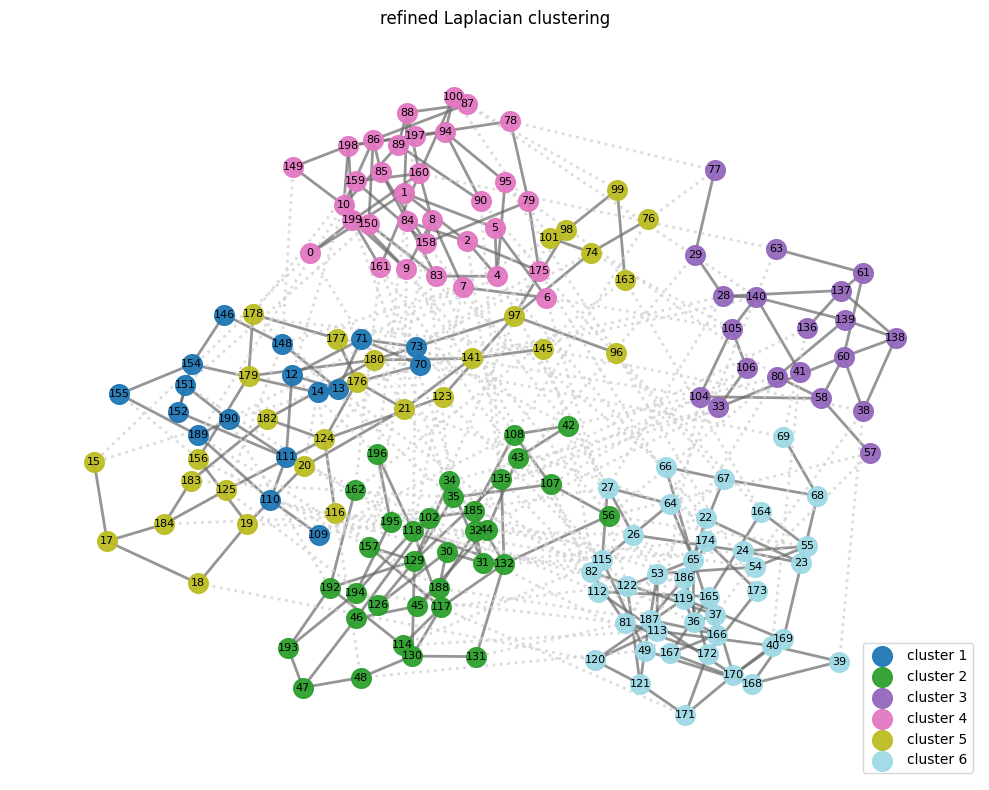

/var/folders/8p/_chtsr094z32zkn82wyl40600000gn/T/ipykernel_6221/4006465038.py:48: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_lap = cm.get_cmap('tab20', len(lap_clusters))
/var/folders/8p/_chtsr094z32zkn82wyl40600000gn/T/ipykernel_6221/4006465038.py:49: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_sig = cm.get_cmap('Pastel1', len(sig_clusters))


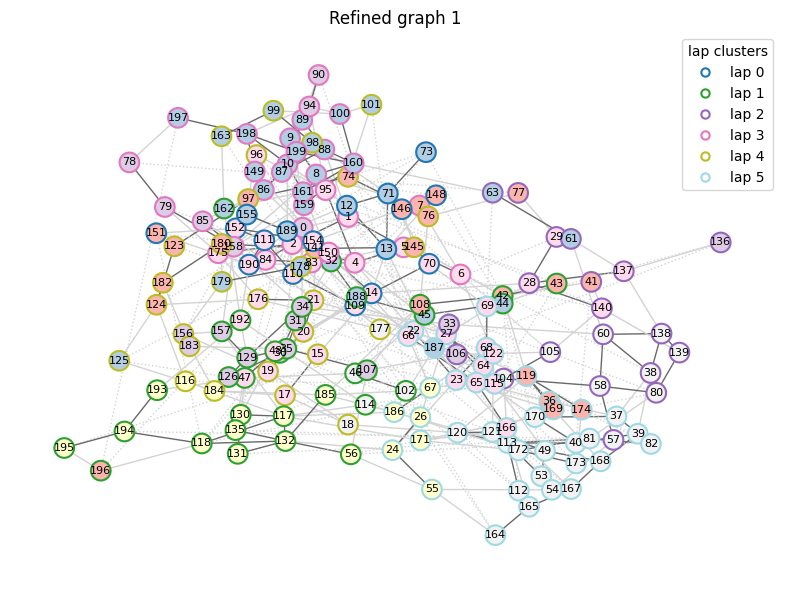

Using labels for layout


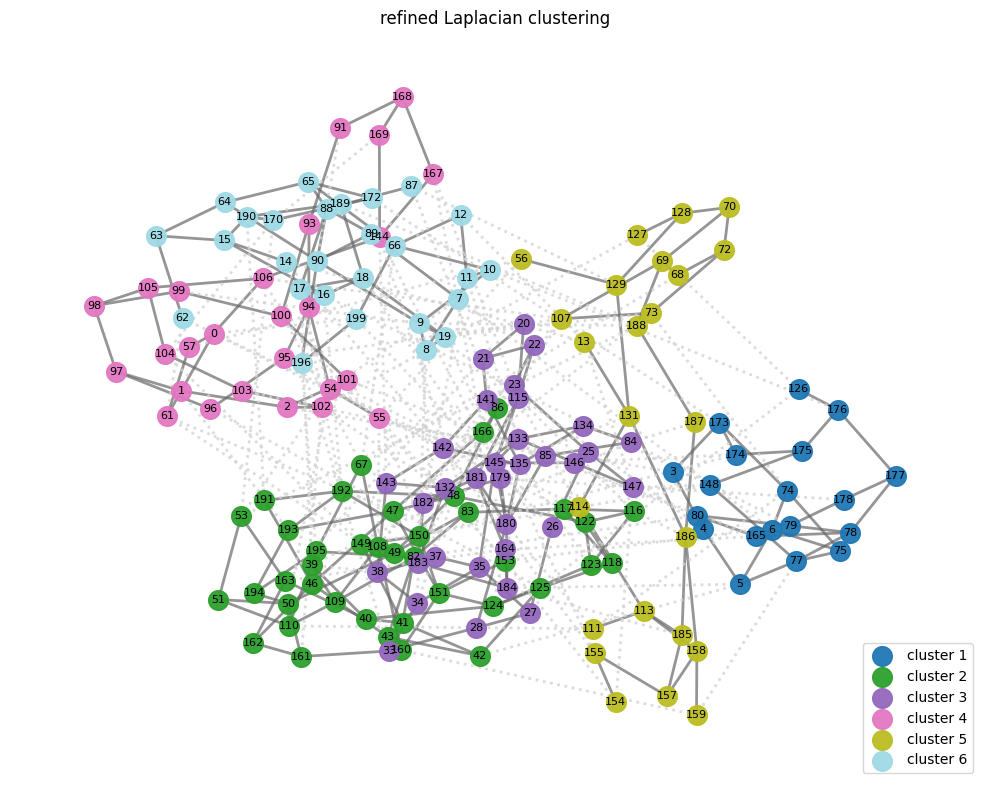

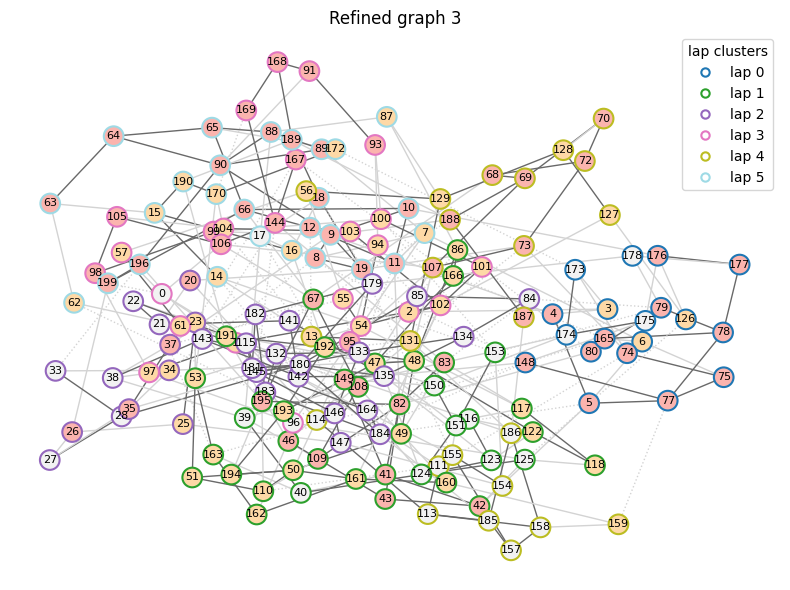

Using labels for layout


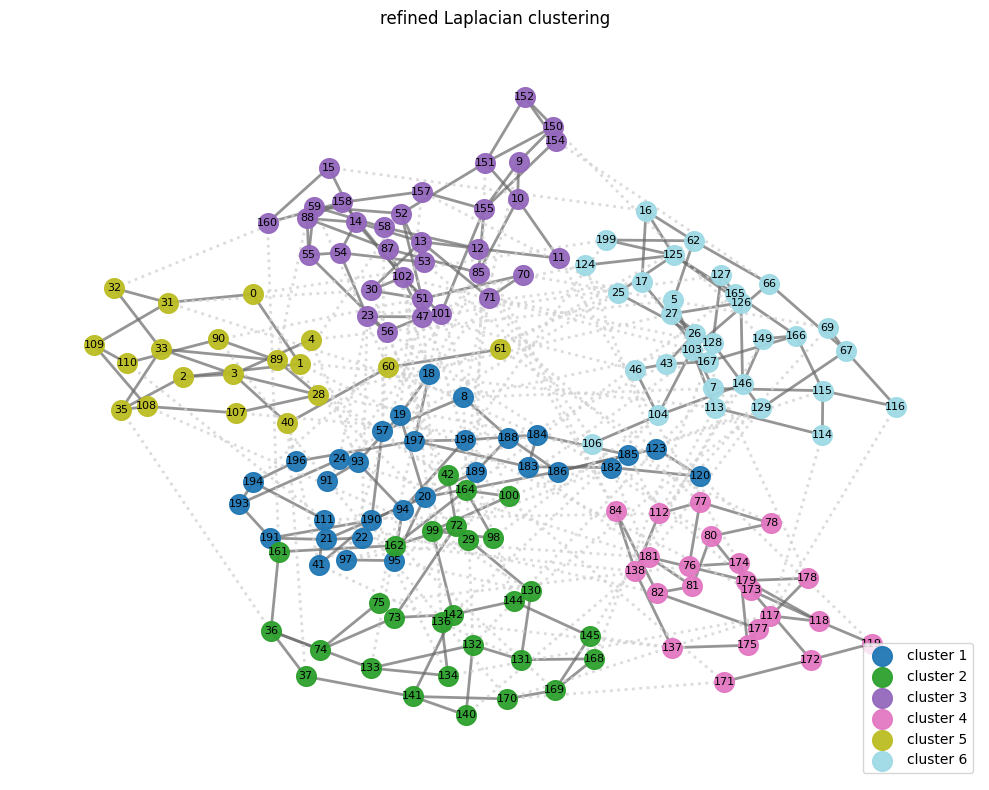

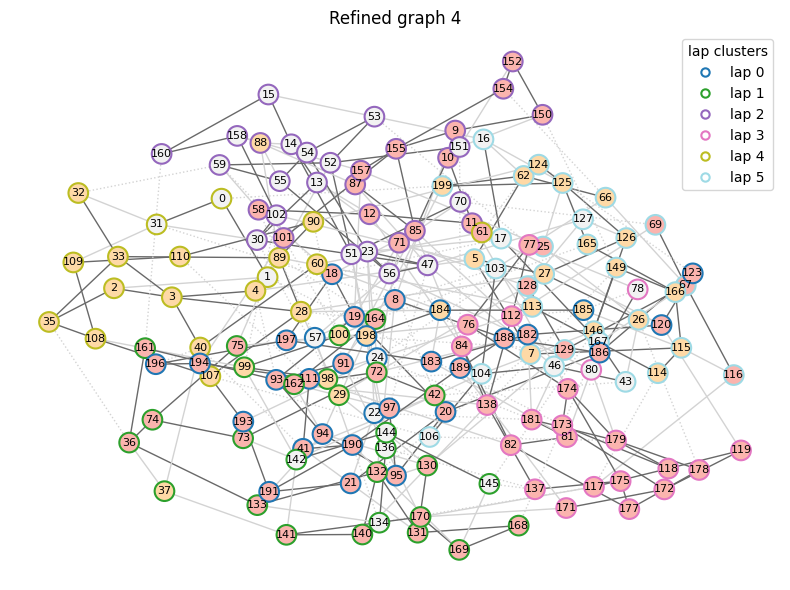

In [287]:
def enforce_connected_clusters(G, labels):
    import networkx as nx
    from itertools import count
    new_labels = labels.copy()
    curr_id = count(max(labels.values()) + 1)
    for cid in set(labels.values()):
        nodes = [n for n in G if labels[n] == cid]
        if len(nodes) < 2:
            continue
        comps = list(nx.connected_components(G.subgraph(nodes)))
        if len(comps) == 1:
            continue
        # Keep first component as is, reassign others
        first = True
        for comp in comps:
            if first:
                first = False
                continue
            new_cid = next(curr_id)
            for n in comp:
                new_labels[n] = new_cid
    return new_labels

def dynamic_dual_bayesian_refinement(
    G, lap_labels, sig_labels, unstable_pairs,
    lap_weight=1.0, sig_weight=1.0, prior_weight=1.0
):
    labels = lap_labels.copy()
    moved = set()
    for ci, cj in unstable_pairs:
        nodes_i = [n for n in G.nodes if labels[n] == ci]
        nodes_j = [n for n in G.nodes if labels[n] == cj]
        border = [n for n in nodes_i + nodes_j
                  if any(labels.get(nb) in (ci, cj) and labels.get(nb) != labels[n] for nb in G.neighbors(n))]
        for n in border:
            if n in moved:
                continue
            nbs = [nb for nb in G.neighbors(n) if labels.get(nb) in (ci, cj)]
            lap_n_i = sum(labels.get(nb) == ci for nb in nbs)
            lap_n_j = sum(labels.get(nb) == cj for nb in nbs)
            sig_n_i = sum(sig_labels.get(nb) == sig_labels.get(n) for nb in nbs if labels.get(nb) == ci)
            sig_n_j = sum(sig_labels.get(nb) == sig_labels.get(n) for nb in nbs if labels.get(nb) == cj)
            posterior_i = prior_weight * (labels[n] == ci) + lap_weight * lap_n_i + sig_weight * sig_n_i
            posterior_j = prior_weight * (labels[n] == cj) + lap_weight * lap_n_j + sig_weight * sig_n_j
            if labels[n] == ci and posterior_j > posterior_i:
                labels[n] = cj
                moved.add(n)
            elif labels[n] == cj and posterior_i > posterior_j:
                labels[n] = ci
                moved.add(n)
    labels = enforce_connected_clusters(G, labels)
    return labels



def batch_bayesian_dual_refinement_and_plot(
    all_perturbation_results, all_data,
    angle_threshold=10,
    lap_weight=1.0, sig_weight=1.0, prior_weight=1.0,
    plot=True
):
    refined_labels_list = []
    for i, (results, data) in enumerate(zip(all_perturbation_results, all_data)):
        if not results or "laplacian" not in data or "signless" not in data:
            refined_labels_list.append(None)
            continue
        G = data["laplacian"]["graph"]
        lap_labels = data["laplacian"].get("labels")
        sig_labels = data["signless"].get("labels")
        sil_lap = data["laplacian"].get("silhouette")
        sil_signless = data["signless"].get("silhouette")
        alpha, beta = compute_alpha_beta(sil_lap, sil_signless)
        if lap_labels is None or sig_labels is None:
            refined_labels_list.append(None)
            continue
        unstable_pairs = [res["clusters_removed"] for res in results if res["angle"] > angle_threshold]
        if not unstable_pairs:
            refined_labels_list.append(lap_labels.copy())
            continue
        refined_labels = dynamic_dual_bayesian_refinement(
            G, lap_labels, sig_labels, unstable_pairs,
            lap_weight=1.0, sig_weight=1.0, prior_weight=1.0
        )

        refined_labels_list.append(refined_labels)
        if plot:
            lap_data = dict(data["laplacian"])
            lap_data["labels"] = refined_labels
            sig_data = data["signless"]
            draw_graph_with_labels(G, labels=refined_labels, title=f"refined Laplacian clustering")
            draw_dual_colored_graph(
                G,
                lap_data,
                sig_data,
                alpha=alpha,
                beta=beta,
                title=f"Refined graph {i+1}"
            )
    return refined_labels_list

refined_labels_list = batch_bayesian_dual_refinement_and_plot(
    all_perturbation_results, all_data,
    angle_threshold=10, lap_weight=1.0, sig_weight=1.0, prior_weight=1.0,
    plot=True
)

Graph 0, trial 0: angle=67.98°, Δspec=0.0479


/var/folders/8p/_chtsr094z32zkn82wyl40600000gn/T/ipykernel_6221/4006465038.py:48: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_lap = cm.get_cmap('tab20', len(lap_clusters))
/var/folders/8p/_chtsr094z32zkn82wyl40600000gn/T/ipykernel_6221/4006465038.py:49: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_sig = cm.get_cmap('Pastel1', len(sig_clusters))


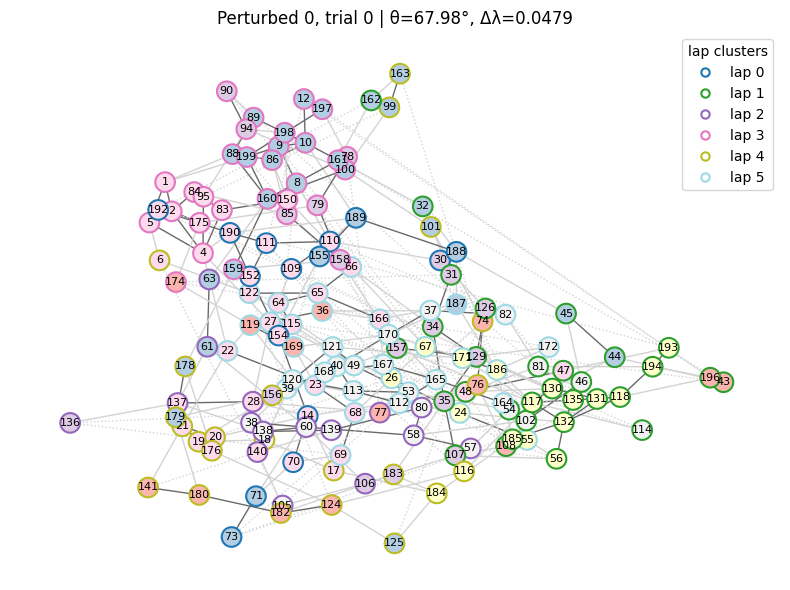

Graph 0, trial 1: angle=32.63°, Δspec=0.0270


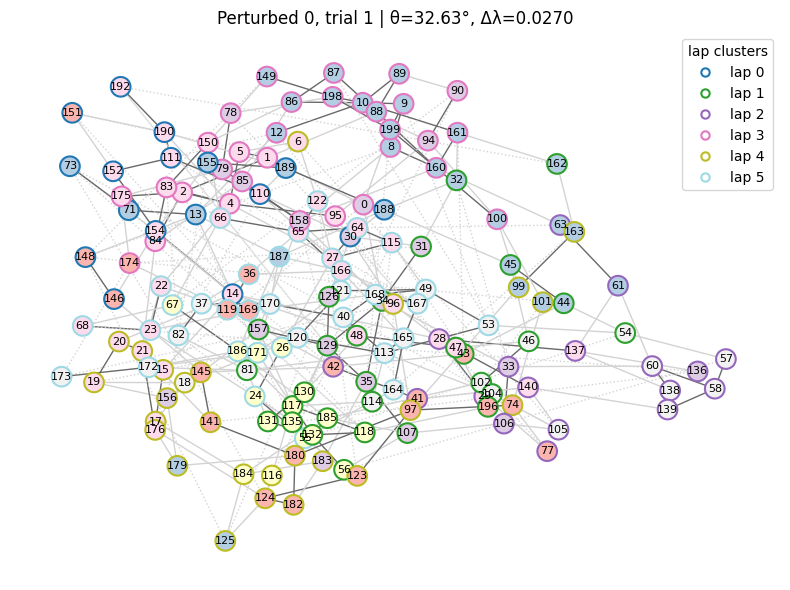

Graph 0, trial 2: angle=45.13°, Δspec=0.0392


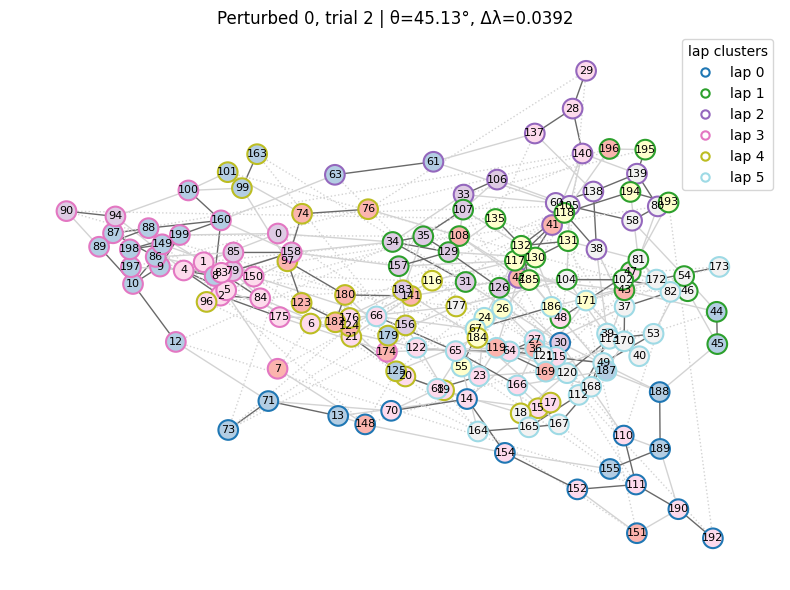

Graph 0, trial 3: angle=44.13°, Δspec=0.0397


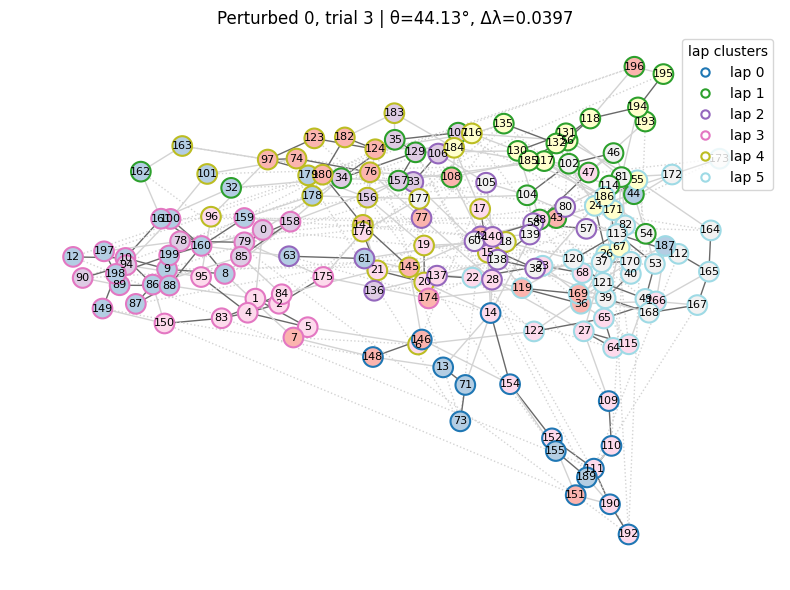

Graph 0, trial 4: angle=47.22°, Δspec=0.0455


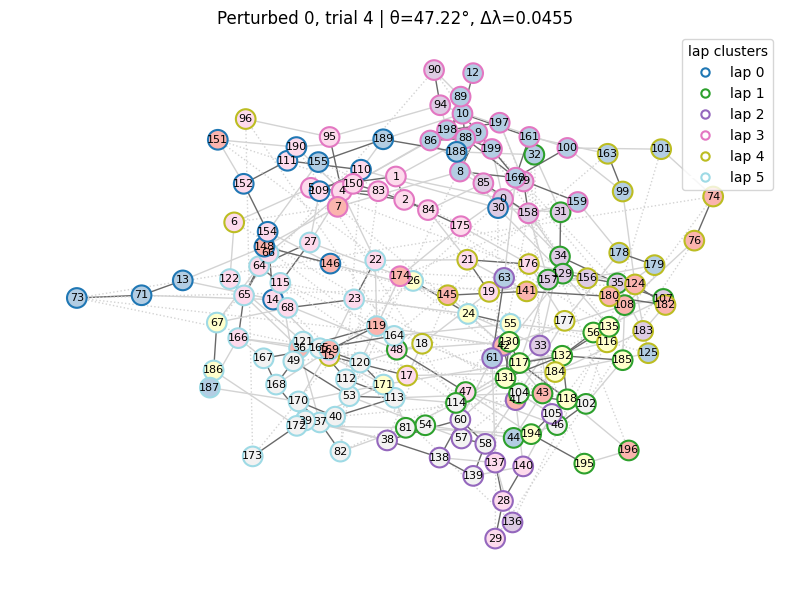

Graph 2, trial 0: angle=51.17°, Δspec=0.0406


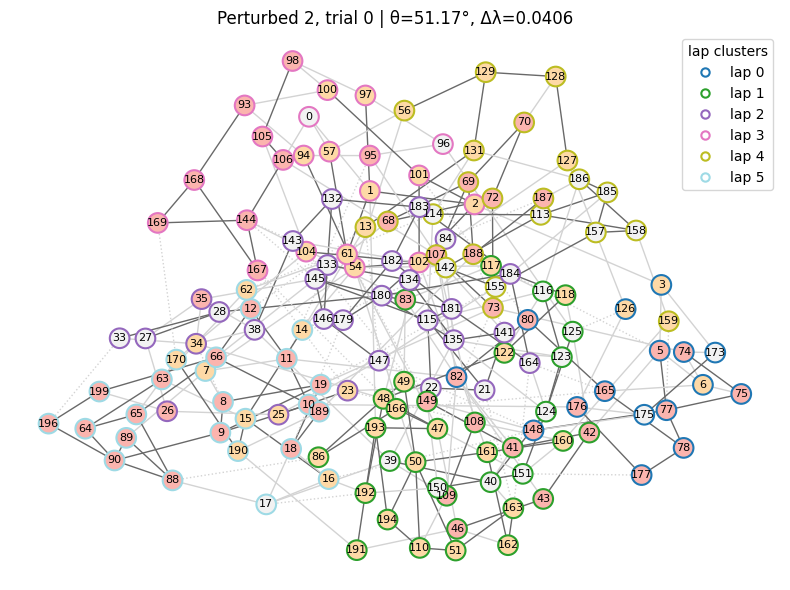

Graph 2, trial 1: angle=84.34°, Δspec=0.0414


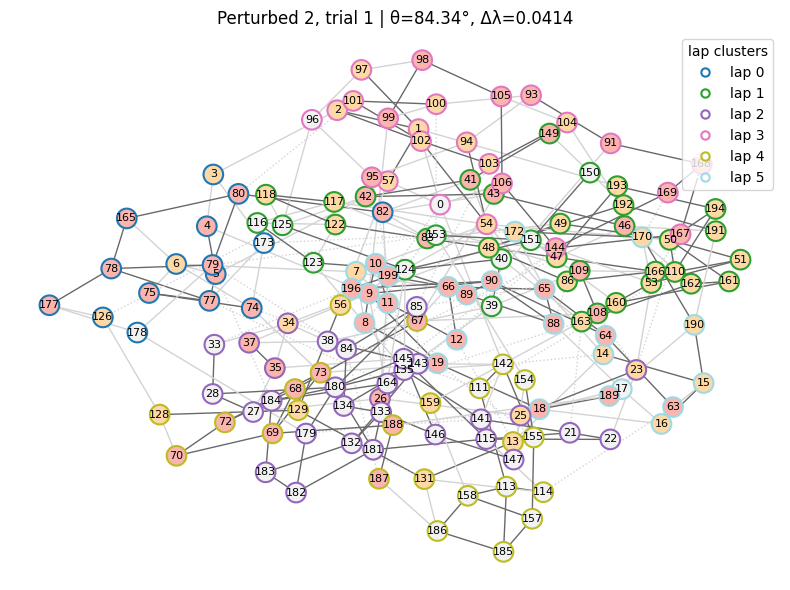

Graph 2, trial 2: angle=37.49°, Δspec=0.0521


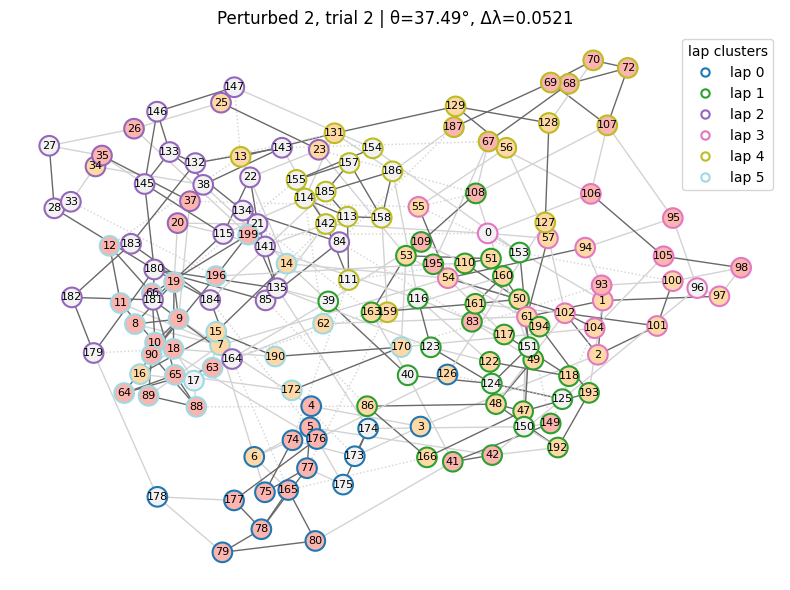

Graph 2, trial 3: angle=39.90°, Δspec=0.0379


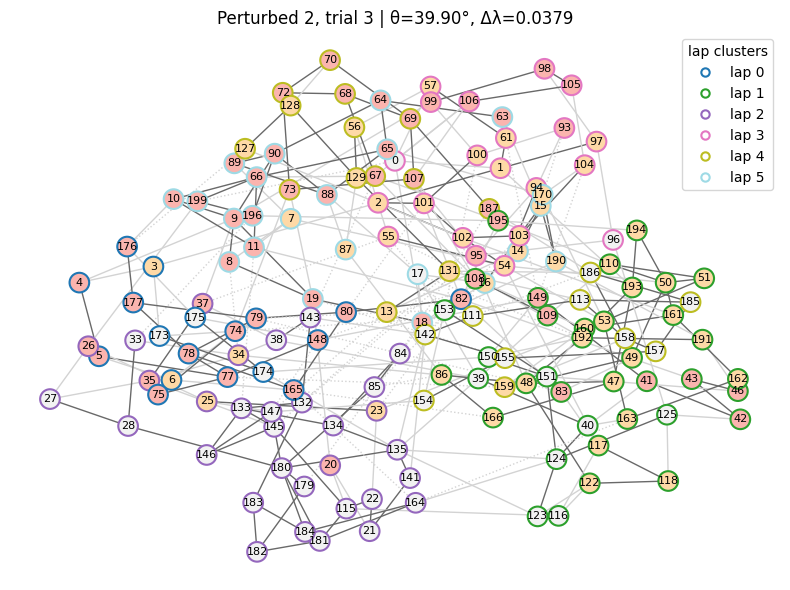

Graph 2, trial 4: angle=59.54°, Δspec=0.0630


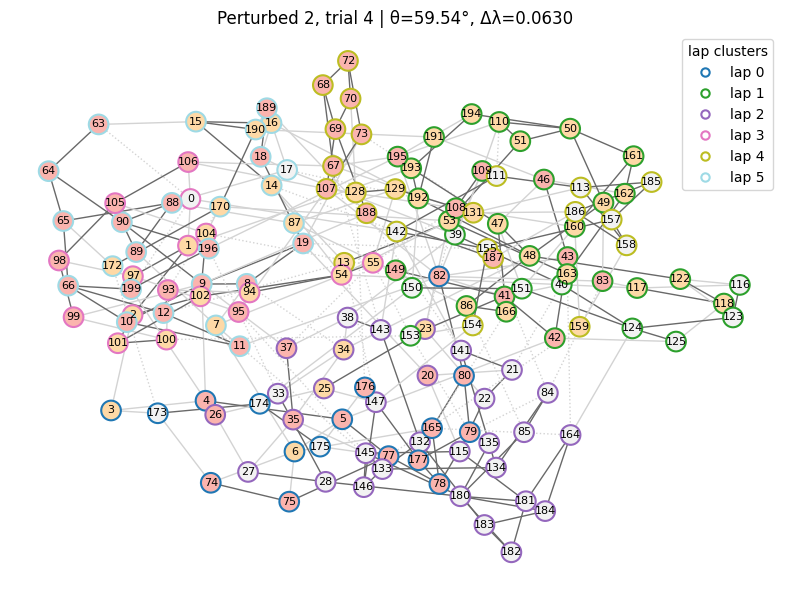

Graph 3, trial 0: angle=73.92°, Δspec=0.0416


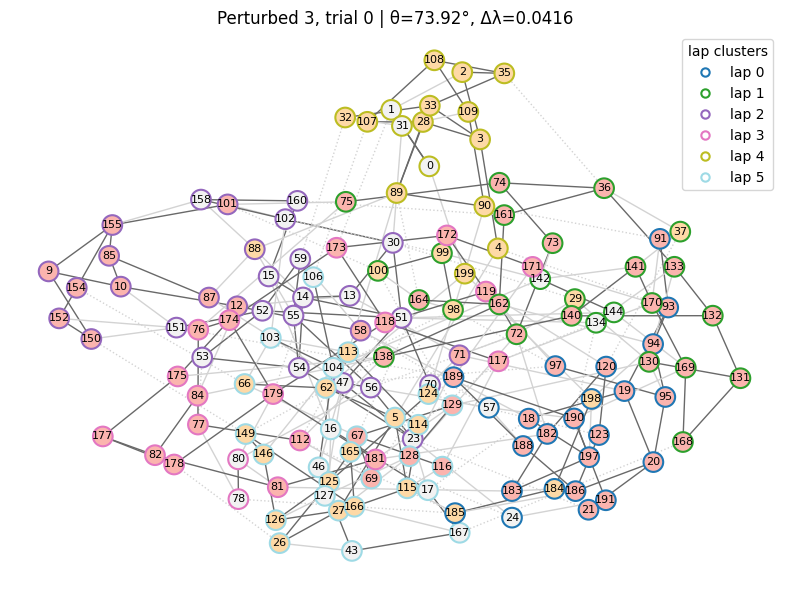

Graph 3, trial 1: angle=54.82°, Δspec=0.0317


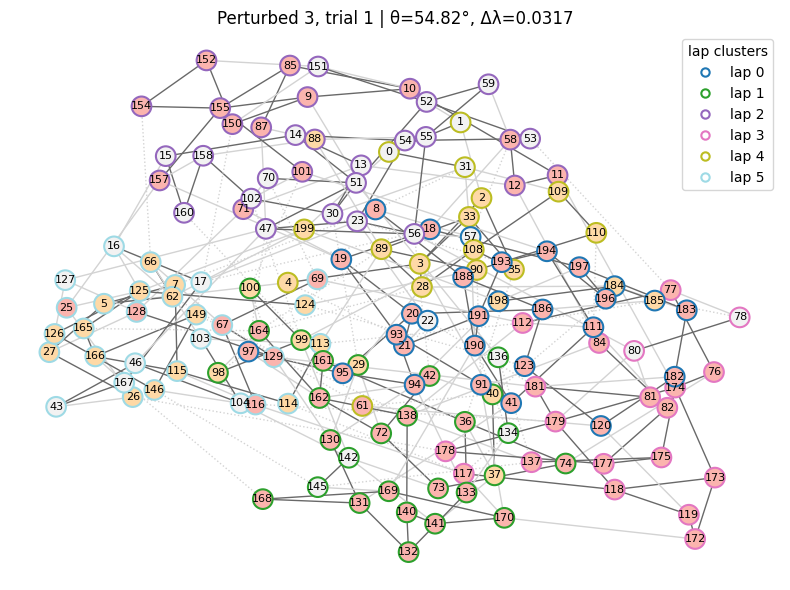

Graph 3, trial 2: angle=75.44°, Δspec=0.0401


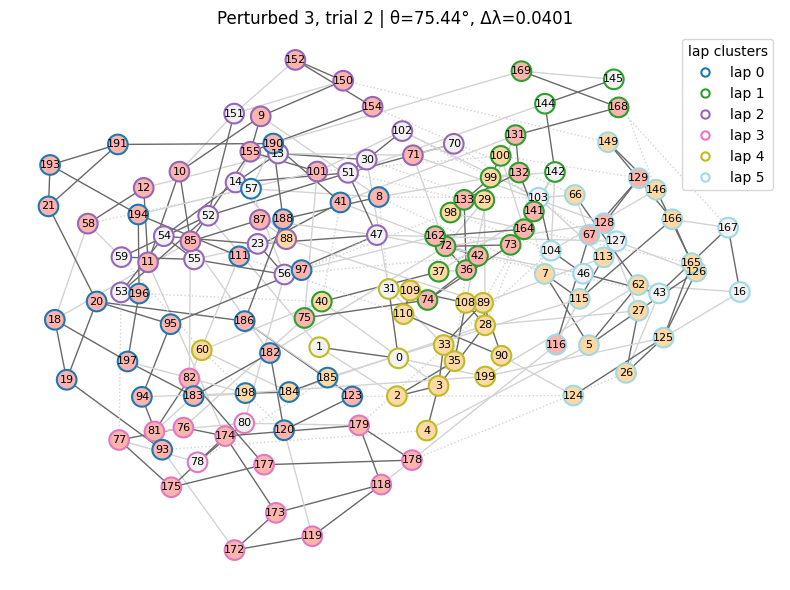

Graph 3, trial 3: angle=85.49°, Δspec=0.0365


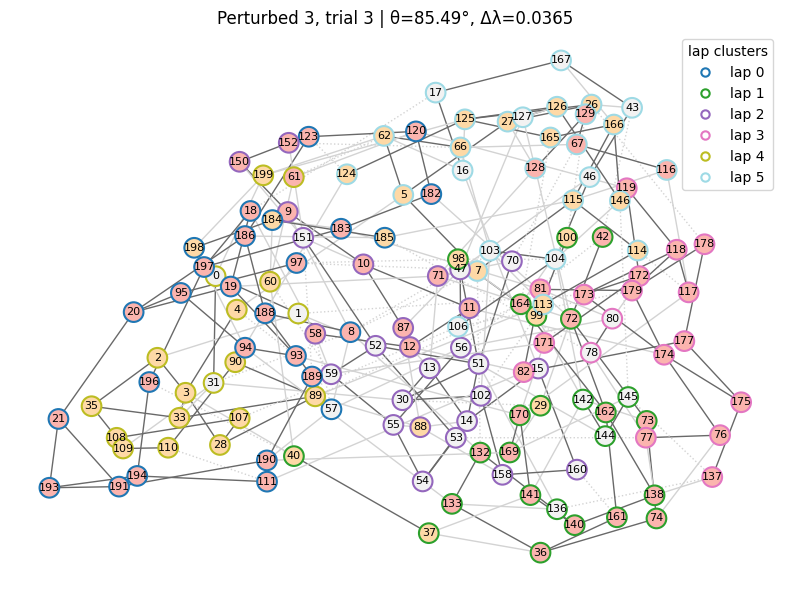

Graph 3, trial 4: angle=86.42°, Δspec=0.0232


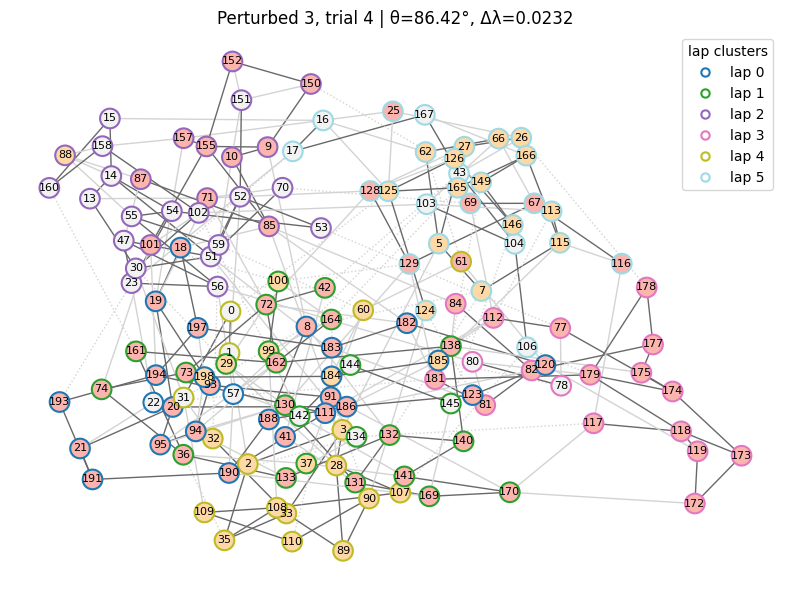

In [290]:
import random

def weighted_imbalance_perturbation(G, labels, edge_weights, nodes_to_perturb, keep=2, weight_attr='weight'):
    Gp = G.copy()
    for n in nodes_to_perturb:
        nbrs = list(Gp.neighbors(n))
        if len(nbrs) <= keep:
            continue
        edges = [(n, v) if n < v else (v, n) for v in nbrs]
        weights = [edge_weights.get((min(e), max(e)), Gp[n][v].get(weight_attr, 1.0)) for e, v in zip(edges, nbrs)]
        top_idxs = sorted(range(len(weights)), key=lambda i: weights[i], reverse=True)[:keep]
        to_remove = [nbrs[i] for i in range(len(nbrs)) if i not in top_idxs and weights[i] < max(weights) * 0.7]
        Gp.remove_edges_from([(n, v) for v in to_remove])
    return Gp

def align_embeddings(G1, G2, vecs1, vecs2):
    nodes1 = np.array(list(G1.nodes()))
    nodes2 = np.array(list(G2.nodes()))
    common = sorted(set(nodes1) & set(nodes2))
    idx1 = [np.where(nodes1 == n)[0][0] for n in common]
    idx2 = [np.where(nodes2 == n)[0][0] for n in common]
    aligned_vecs1 = vecs1[idx1]
    aligned_vecs2 = vecs2[idx2]
    return aligned_vecs1, aligned_vecs2


def analyze_imbalance_perturbations(all_data, num_nodes_per_cluster=3, keep=2, n_trials=5, angle_threshold=10):
    from collections import defaultdict
    import numpy as np

    results = []
    for idx, data in enumerate(all_data):
        G = data["laplacian"]["graph"]
        edge_weights = data["edge_weights"] or {}
        lap_labels = data["laplacian"].get("labels")
        if lap_labels is None:
            continue

        cluster_map = defaultdict(list)
        for n, c in lap_labels.items():
            cluster_map[c].append(n)

        for trial in range(n_trials):
            nodes_to_perturb = []
            for c, nodes in cluster_map.items():
                candidates = [n for n in nodes if G.degree(n) > keep]
                random.shuffle(candidates)
                nodes_to_perturb += candidates[:num_nodes_per_cluster]

            Gp = weighted_imbalance_perturbation(G, lap_labels, edge_weights, nodes_to_perturb, keep=keep)
            Gp_contr, _ = full_contraction_ham(Gp)

            k = max(2, len(set(lap_labels.values())))
            vals_ref, vecs_ref = get_laplacian_subspace(G, k=k)
            vals_pert, vecs_pert = get_laplacian_subspace(Gp_contr, k=k)
            aligned_vecs_ref, aligned_vecs_pert = align_embeddings(G, Gp_contr, vecs_ref, vecs_pert)
            angle = max_principal_angle(aligned_vecs_ref, aligned_vecs_pert)
            delta_spec = spectrum_diff(vals_ref, vals_pert)


            print(f"Graph {idx}, trial {trial}: angle={angle:.2f}°, Δspec={delta_spec:.4f}")
            draw_dual_colored_graph(
                Gp_contr,
                data["laplacian"],
                data["signless"],
                alpha=data["alpha"],
                beta=data["beta"],
                title=f"Perturbed {idx}, trial {trial} | θ={angle:.2f}°, Δλ={delta_spec:.4f}"
            )

            results.append({
                "graph_idx": idx,
                "trial": trial,
                "angle": angle,
                "spectrum_diff": delta_spec,
                "nodes_perturbed": nodes_to_perturb
            })
    return results

imbalance_results = analyze_imbalance_perturbations(
    all_data,
    num_nodes_per_cluster=4,
    keep=2,
    n_trials=5
)

